In [139]:
import pandas as pd
import numpy as np

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from scipy.stats import f_oneway

import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection

import seaborn as sns

In [140]:
OpenFoodProducts = pd.read_csv("fr-openfoodfacts-org-products.csv", sep='\t', low_memory=False)
OpenFoodProducts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Columns: 162 entries, code to water-hardness_100g
dtypes: float64(106), object(56)
memory usage: 396.5+ MB


In [141]:
OpenFoodProducts.columns.tolist()

['code',
 'url',
 'creator',
 'created_t',
 'created_datetime',
 'last_modified_t',
 'last_modified_datetime',
 'product_name',
 'generic_name',
 'quantity',
 'packaging',
 'packaging_tags',
 'brands',
 'brands_tags',
 'categories',
 'categories_tags',
 'categories_fr',
 'origins',
 'origins_tags',
 'manufacturing_places',
 'manufacturing_places_tags',
 'labels',
 'labels_tags',
 'labels_fr',
 'emb_codes',
 'emb_codes_tags',
 'first_packaging_code_geo',
 'cities',
 'cities_tags',
 'purchase_places',
 'stores',
 'countries',
 'countries_tags',
 'countries_fr',
 'ingredients_text',
 'allergens',
 'allergens_fr',
 'traces',
 'traces_tags',
 'traces_fr',
 'serving_size',
 'no_nutriments',
 'additives_n',
 'additives',
 'additives_tags',
 'additives_fr',
 'ingredients_from_palm_oil_n',
 'ingredients_from_palm_oil',
 'ingredients_from_palm_oil_tags',
 'ingredients_that_may_be_from_palm_oil_n',
 'ingredients_that_may_be_from_palm_oil',
 'ingredients_that_may_be_from_palm_oil_tags',
 'nutritio

In [142]:
OpenFoodProducts_general_informations = OpenFoodProducts.iloc[:, 0: 10]
OpenFoodProducts_tags = OpenFoodProducts.iloc[:, 10: 34]
OpenFoodProducts_ingredients = OpenFoodProducts[['ingredients_text','traces','traces_tags']]
OpenFoodProducts_misc_data = OpenFoodProducts[['serving_size', 'no_nutriments', 'additives_n', 'additives', 'additives_tags',
'ingredients_from_palm_oil_n',
'ingredients_from_palm_oil',
'ingredients_from_palm_oil_tags',
'ingredients_that_may_be_from_palm_oil_n',
'ingredients_that_may_be_from_palm_oil',
'ingredients_that_may_be_from_palm_oil_tags',
'nutrition_grade_fr','main_category','main_category_fr','image_url','image_small_url']]
#'energy-kj_100g', --> colonne non existante
#'energy-kcal_100g', --> colonne non existante
OpenFoodProducts_nutrition_facts = OpenFoodProducts[['energy_100g',
 'energy-from-fat_100g',
 'fat_100g',
 'saturated-fat_100g',
 'butyric-acid_100g',
 'caproic-acid_100g',
 'caprylic-acid_100g',
 'capric-acid_100g',
 'lauric-acid_100g',
 'myristic-acid_100g',
 'palmitic-acid_100g',
 'stearic-acid_100g',
 'arachidic-acid_100g',
 'behenic-acid_100g',
 'lignoceric-acid_100g',
 'cerotic-acid_100g',
 'montanic-acid_100g',
 'melissic-acid_100g',
 'monounsaturated-fat_100g',
 'polyunsaturated-fat_100g',
 'omega-3-fat_100g',
 'alpha-linolenic-acid_100g',
 'eicosapentaenoic-acid_100g',
 'docosahexaenoic-acid_100g',
 'omega-6-fat_100g',
 'linoleic-acid_100g',
 'arachidonic-acid_100g',
 'gamma-linolenic-acid_100g',
 'dihomo-gamma-linolenic-acid_100g',
 'omega-9-fat_100g',
 'oleic-acid_100g',
 'elaidic-acid_100g',
 'gondoic-acid_100g',
 'mead-acid_100g',
 'erucic-acid_100g',
 'nervonic-acid_100g',
 'trans-fat_100g',
 'cholesterol_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'sucrose_100g',
 'glucose_100g',
 'fructose_100g',
 'lactose_100g',
 'maltose_100g',
 'maltodextrins_100g',
 'starch_100g',
 'polyols_100g',
 'fiber_100g',
 'proteins_100g',
 'casein_100g',
 'serum-proteins_100g',
 'nucleotides_100g',
 'salt_100g',
 'sodium_100g',
 'alcohol_100g',
 'vitamin-a_100g',
 'beta-carotene_100g',
 'vitamin-d_100g',
 'vitamin-e_100g',
 'vitamin-k_100g',
 'vitamin-c_100g',
 'vitamin-b1_100g',
 'vitamin-b2_100g',
 'vitamin-pp_100g',
 'vitamin-b6_100g',
 'vitamin-b9_100g',
 'folates_100g',
 'vitamin-b12_100g',
 'biotin_100g',
 'pantothenic-acid_100g',
 'silica_100g',
 'bicarbonate_100g',
 'potassium_100g',
 'chloride_100g',
 'calcium_100g',
 'phosphorus_100g',
 'iron_100g',
 'magnesium_100g',
 'zinc_100g',
 'copper_100g',
 'manganese_100g',
 'fluoride_100g',
 'selenium_100g',
 'chromium_100g',
 'molybdenum_100g',
 'iodine_100g',
 'caffeine_100g',
 'taurine_100g',
 'ph_100g',
 'fruits-vegetables-nuts_100g',
 'collagen-meat-protein-ratio_100g',
 'cocoa_100g',
 'chlorophyl_100g',
 'carbon-footprint_100g',
 'nutrition-score-fr_100g',
 'nutrition-score-uk_100g']]

In [143]:
OpenFoodProducts_general_informations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 10 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   code                    320749 non-null  object
 1   url                     320749 non-null  object
 2   creator                 320770 non-null  object
 3   created_t               320769 non-null  object
 4   created_datetime        320763 non-null  object
 5   last_modified_t         320772 non-null  object
 6   last_modified_datetime  320772 non-null  object
 7   product_name            303010 non-null  object
 8   generic_name            52795 non-null   object
 9   quantity                104819 non-null  object
dtypes: object(10)
memory usage: 24.5+ MB


In [144]:
len(OpenFoodProducts_general_informations.drop_duplicates())

320772

In [145]:
OpenFoodProducts_general_informations.head()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg
1,0000000004530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN
2,0000000004559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,NaN
3,0000000016087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,NaN
4,0000000016094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,NaN,NaN


In [146]:
OpenFoodProducts_general_informations=OpenFoodProducts_general_informations.drop(columns=['created_t','last_modified_t','last_modified_t'])

In [147]:
OpenFoodProducts_general_informations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 8 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   code                    320749 non-null  object
 1   url                     320749 non-null  object
 2   creator                 320770 non-null  object
 3   created_datetime        320763 non-null  object
 4   last_modified_datetime  320772 non-null  object
 5   product_name            303010 non-null  object
 6   generic_name            52795 non-null   object
 7   quantity                104819 non-null  object
dtypes: object(8)
memory usage: 19.6+ MB


In [148]:
OpenFoodProducts_tags.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 24 columns):
 #   Column                     Non-Null Count   Dtype 
---  ------                     --------------   ----- 
 0   packaging                  78960 non-null   object
 1   packaging_tags             78961 non-null   object
 2   brands                     292360 non-null  object
 3   brands_tags                292352 non-null  object
 4   categories                 84410 non-null   object
 5   categories_tags            84389 non-null   object
 6   categories_fr              84411 non-null   object
 7   origins                    22190 non-null   object
 8   origins_tags               22153 non-null   object
 9   manufacturing_places       36501 non-null   object
 10  manufacturing_places_tags  36495 non-null   object
 11  labels                     46559 non-null   object
 12  labels_tags                46644 non-null   object
 13  labels_fr                  46666 non-null   

In [149]:
OpenFoodProducts_tags.head()

,packaging,packaging_tags,brands,brands_tags,categories,categories_tags,categories_fr,origins,origins_tags,manufacturing_places,...,emb_codes,emb_codes_tags,first_packaging_code_geo,cities,cities_tags,purchase_places,stores,countries,countries_tags,countries_fr
0,NaN,NaN,Ferme t'y R'nao,ferme-t-y-r-nao,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,en:FR,en:france,France
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,en:united-states,États-Unis
2,NaN,NaN,Torn & Glasser,torn-glasser,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,en:united-states,États-Unis
3,NaN,NaN,Grizzlies,grizzlies,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,en:united-states,États-Unis
4,NaN,NaN,Bob's Red Mill,bob-s-red-mill,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,en:united-states,États-Unis


Les valeurs _tags et _fr représentent aussi des données en doublon mais en format différent, donc j'ai décidé de garder uniquement les données dans le format original en supprimant les colonnes _tags et _fr. 

In [150]:
columns_kept = [i for i in OpenFoodProducts_tags.columns if ('tags' not in i) & ('fr'not in i)]
OpenFoodProducts_tags = OpenFoodProducts_tags[columns_kept]

In [151]:
OpenFoodProducts_tags.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 12 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   packaging                 78960 non-null   object
 1   brands                    292360 non-null  object
 2   categories                84410 non-null   object
 3   origins                   22190 non-null   object
 4   manufacturing_places      36501 non-null   object
 5   labels                    46559 non-null   object
 6   emb_codes                 29306 non-null   object
 7   first_packaging_code_geo  18803 non-null   object
 8   cities                    23 non-null      object
 9   purchase_places           58193 non-null   object
 10  stores                    51722 non-null   object
 11  countries                 320492 non-null  object
dtypes: object(12)
memory usage: 29.4+ MB


In [152]:
OpenFoodProducts_tags.head()

,packaging,brands,categories,origins,manufacturing_places,labels,emb_codes,first_packaging_code_geo,cities,purchase_places,stores,countries
0,NaN,Ferme t'y R'nao,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,en:FR
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US
2,NaN,Torn & Glasser,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US
3,NaN,Grizzlies,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US
4,NaN,Bob's Red Mill,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US


In [153]:
OpenFoodProducts_tagsMissing = OpenFoodProducts_tags.isna()
OpenFoodProducts_tagsMissing.mean()*100

packaging                   75.384385
brands                       8.857382
categories                  73.685359
origins                     93.082314
manufacturing_places        88.620890
labels                      85.485329
emb_codes                   90.863916
first_packaging_code_geo    94.138204
cities                      99.992830
purchase_places             81.858454
stores                      83.875775
countries                    0.087289
dtype: float64

J'ai décidé aussi de supprimer toutes les colonnes il y a un manque d'informations >90%

In [154]:
OpenFoodProducts_tags=OpenFoodProducts_tags.drop(columns=['origins','emb_codes','first_packaging_code_geo','cities'])
OpenFoodProducts_tags.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 8 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   packaging             78960 non-null   object
 1   brands                292360 non-null  object
 2   categories            84410 non-null   object
 3   manufacturing_places  36501 non-null   object
 4   labels                46559 non-null   object
 5   purchase_places       58193 non-null   object
 6   stores                51722 non-null   object
 7   countries             320492 non-null  object
dtypes: object(8)
memory usage: 19.6+ MB


In [155]:
OpenFoodProducts_ingredients.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 3 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   ingredients_text  248962 non-null  object
 1   traces            24353 non-null   object
 2   traces_tags       24329 non-null   object
dtypes: object(3)
memory usage: 7.3+ MB


In [156]:
OpenFoodProducts_ingredients.head()

,ingredients_text,traces,traces_tags
0,NaN,NaN,NaN
1,"Bananas, vegetable oil (coconut oil, corn oil ...",NaN,NaN
2,"Peanuts, wheat flour, sugar, rice flour, tapio...",NaN,NaN
3,"Organic hazelnuts, organic cashews, organic wa...",NaN,NaN
4,Organic polenta,NaN,NaN


De même, on garde uniquement la valeur originale et pas les tags. 

In [157]:
OpenFoodProducts_ingredients=OpenFoodProducts_ingredients.drop(columns='traces_tags')

In [158]:
OpenFoodProducts_ingredients.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 2 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   ingredients_text  248962 non-null  object
 1   traces            24353 non-null   object
dtypes: object(2)
memory usage: 4.9+ MB


In [159]:
OpenFoodProducts_misc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 16 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   serving_size                                211331 non-null  object 
 1   no_nutriments                               0 non-null       float64
 2   additives_n                                 248939 non-null  float64
 3   additives                                   248905 non-null  object 
 4   additives_tags                              154680 non-null  object 
 5   ingredients_from_palm_oil_n                 248939 non-null  float64
 6   ingredients_from_palm_oil                   0 non-null       float64
 7   ingredients_from_palm_oil_tags              4835 non-null    object 
 8   ingredients_that_may_be_from_palm_oil_n     248939 non-null  float64
 9   ingredients_that_may_be_from_palm_oil       0 non-null       float64
 

In [160]:
OpenFoodProducts_misc_data.head()

,serving_size,no_nutriments,additives_n,additives,additives_tags,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,ingredients_that_may_be_from_palm_oil_tags,nutrition_grade_fr,main_category,main_category_fr,image_url,image_small_url
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,28 g (1 ONZ),NaN,0.0,[ bananas -> en:bananas ] [ vegetable-oil -...,NaN,0.0,NaN,NaN,0.0,NaN,NaN,d,NaN,NaN,NaN,NaN
2,28 g (0.25 cup),NaN,0.0,[ peanuts -> en:peanuts ] [ wheat-flour -> ...,NaN,0.0,NaN,NaN,0.0,NaN,NaN,b,NaN,NaN,NaN,NaN
3,28 g (0.25 cup),NaN,0.0,[ organic-hazelnuts -> en:organic-hazelnuts ...,NaN,0.0,NaN,NaN,0.0,NaN,NaN,d,NaN,NaN,NaN,NaN
4,35 g (0.25 cup),NaN,0.0,[ organic-polenta -> en:organic-polenta ] [...,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [161]:
OpenFoodProducts_misc_dataMissing = OpenFoodProducts_misc_data.isna()
OpenFoodProducts_misc_dataMissing.mean()*100

serving_size                                   34.118003
no_nutriments                                 100.000000
additives_n                                    22.393787
additives                                      22.404387
additives_tags                                 51.778834
ingredients_from_palm_oil_n                    22.393787
ingredients_from_palm_oil                     100.000000
ingredients_from_palm_oil_tags                 98.492699
ingredients_that_may_be_from_palm_oil_n        22.393787
ingredients_that_may_be_from_palm_oil         100.000000
ingredients_that_may_be_from_palm_oil_tags     96.353796
nutrition_grade_fr                             31.038245
main_category                                  73.699076
main_category_fr                               73.699076
image_url                                      76.358286
image_small_url                                76.358286
dtype: float64

De même, je supprime toutes les colonnes dont on note qu'il y a plus de 90% de données manquantes

In [162]:
OpenFoodProducts_misc_data=OpenFoodProducts_misc_data.drop(columns=['no_nutriments','ingredients_from_palm_oil','ingredients_from_palm_oil_tags','ingredients_that_may_be_from_palm_oil','ingredients_that_may_be_from_palm_oil_tags'])
OpenFoodProducts_misc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 11 columns):
 #   Column                                   Non-Null Count   Dtype  
---  ------                                   --------------   -----  
 0   serving_size                             211331 non-null  object 
 1   additives_n                              248939 non-null  float64
 2   additives                                248905 non-null  object 
 3   additives_tags                           154680 non-null  object 
 4   ingredients_from_palm_oil_n              248939 non-null  float64
 5   ingredients_that_may_be_from_palm_oil_n  248939 non-null  float64
 6   nutrition_grade_fr                       221210 non-null  object 
 7   main_category                            84366 non-null   object 
 8   main_category_fr                         84366 non-null   object 
 9   image_url                                75836 non-null   object 
 10  image_small_url                 

In [163]:
OpenFoodProducts_misc_data.head()

,serving_size,additives_n,additives,additives_tags,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,main_category,main_category_fr,image_url,image_small_url
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,28 g (1 ONZ),0.0,[ bananas -> en:bananas ] [ vegetable-oil -...,NaN,0.0,0.0,d,NaN,NaN,NaN,NaN
2,28 g (0.25 cup),0.0,[ peanuts -> en:peanuts ] [ wheat-flour -> ...,NaN,0.0,0.0,b,NaN,NaN,NaN,NaN
3,28 g (0.25 cup),0.0,[ organic-hazelnuts -> en:organic-hazelnuts ...,NaN,0.0,0.0,d,NaN,NaN,NaN,NaN
4,35 g (0.25 cup),0.0,[ organic-polenta -> en:organic-polenta ] [...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN


De même, on supprime les données en doublons, qui sont les tags, les traductions en fr ou encore l'URL de la small image

In [164]:
columns_kept = [i for i in OpenFoodProducts_misc_data.columns if ('tags' not in i) & ('fr'not in i) & ('small'not in i)]
OpenFoodProducts_misc_data = OpenFoodProducts_misc_data[columns_kept]

In [165]:
OpenFoodProducts_misc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 5 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   serving_size   211331 non-null  object 
 1   additives_n    248939 non-null  float64
 2   additives      248905 non-null  object 
 3   main_category  84366 non-null   object 
 4   image_url      75836 non-null   object 
dtypes: float64(1), object(4)
memory usage: 12.2+ MB


In [166]:
OpenFoodProducts_misc_data.head()

,serving_size,additives_n,additives,main_category,image_url
0,NaN,NaN,NaN,NaN,NaN
1,28 g (1 ONZ),0.0,[ bananas -> en:bananas ] [ vegetable-oil -...,NaN,NaN
2,28 g (0.25 cup),0.0,[ peanuts -> en:peanuts ] [ wheat-flour -> ...,NaN,NaN
3,28 g (0.25 cup),0.0,[ organic-hazelnuts -> en:organic-hazelnuts ...,NaN,NaN
4,35 g (0.25 cup),0.0,[ organic-polenta -> en:organic-polenta ] [...,NaN,NaN


In [167]:
OpenFoodProducts_nutrition_facts.columns.tolist()

['energy_100g',
 'energy-from-fat_100g',
 'fat_100g',
 'saturated-fat_100g',
 'butyric-acid_100g',
 'caproic-acid_100g',
 'caprylic-acid_100g',
 'capric-acid_100g',
 'lauric-acid_100g',
 'myristic-acid_100g',
 'palmitic-acid_100g',
 'stearic-acid_100g',
 'arachidic-acid_100g',
 'behenic-acid_100g',
 'lignoceric-acid_100g',
 'cerotic-acid_100g',
 'montanic-acid_100g',
 'melissic-acid_100g',
 'monounsaturated-fat_100g',
 'polyunsaturated-fat_100g',
 'omega-3-fat_100g',
 'alpha-linolenic-acid_100g',
 'eicosapentaenoic-acid_100g',
 'docosahexaenoic-acid_100g',
 'omega-6-fat_100g',
 'linoleic-acid_100g',
 'arachidonic-acid_100g',
 'gamma-linolenic-acid_100g',
 'dihomo-gamma-linolenic-acid_100g',
 'omega-9-fat_100g',
 'oleic-acid_100g',
 'elaidic-acid_100g',
 'gondoic-acid_100g',
 'mead-acid_100g',
 'erucic-acid_100g',
 'nervonic-acid_100g',
 'trans-fat_100g',
 'cholesterol_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'sucrose_100g',
 'glucose_100g',
 'fructose_100g',
 'lactose_100g',
 'ma

In [168]:
OpenFoodProducts_nutrition_facts_Missing = OpenFoodProducts_nutrition_facts.isna()
OpenFoodProducts_nutrition_facts_Missing_Pourcentage=OpenFoodProducts_nutrition_facts_Missing.mean()*100

In [169]:
Column_to_remove = OpenFoodProducts_nutrition_facts_Missing_Pourcentage[OpenFoodProducts_nutrition_facts_Missing_Pourcentage > 90].index
OpenFoodProducts_nutrition_facts_Missing = OpenFoodProducts_nutrition_facts_Missing.drop(Column_to_remove, axis=1)

In [170]:
OpenFoodProducts_nutrition_facts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 97 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   energy_100g                       261113 non-null  float64
 1   energy-from-fat_100g              857 non-null     float64
 2   fat_100g                          243891 non-null  float64
 3   saturated-fat_100g                229554 non-null  float64
 4   butyric-acid_100g                 0 non-null       float64
 5   caproic-acid_100g                 0 non-null       float64
 6   caprylic-acid_100g                1 non-null       float64
 7   capric-acid_100g                  2 non-null       float64
 8   lauric-acid_100g                  4 non-null       float64
 9   myristic-acid_100g                1 non-null       float64
 10  palmitic-acid_100g                1 non-null       float64
 11  stearic-acid_100g                 1 non-null       f

In [171]:
OpenFoodProducts_nutrition_facts_percentage = OpenFoodProducts_nutrition_facts.drop(columns=["fruits-vegetables-nuts_100g"]).isnull().mean()

In [172]:
columns_to_drop = OpenFoodProducts_nutrition_facts_percentage[OpenFoodProducts_nutrition_facts_percentage > 0.9].index.tolist()

In [173]:
OpenFoodProducts_nutrition_facts = OpenFoodProducts_nutrition_facts.drop(columns=columns_to_drop)

In [174]:
OpenFoodProducts_nutrition_facts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 18 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   energy_100g                  261113 non-null  float64
 1   fat_100g                     243891 non-null  float64
 2   saturated-fat_100g           229554 non-null  float64
 3   trans-fat_100g               143298 non-null  float64
 4   cholesterol_100g             144090 non-null  float64
 5   carbohydrates_100g           243588 non-null  float64
 6   sugars_100g                  244971 non-null  float64
 7   fiber_100g                   200886 non-null  float64
 8   proteins_100g                259922 non-null  float64
 9   salt_100g                    255510 non-null  float64
 10  sodium_100g                  255463 non-null  float64
 11  vitamin-a_100g               137554 non-null  float64
 12  vitamin-c_100g               140867 non-null  float64
 13 

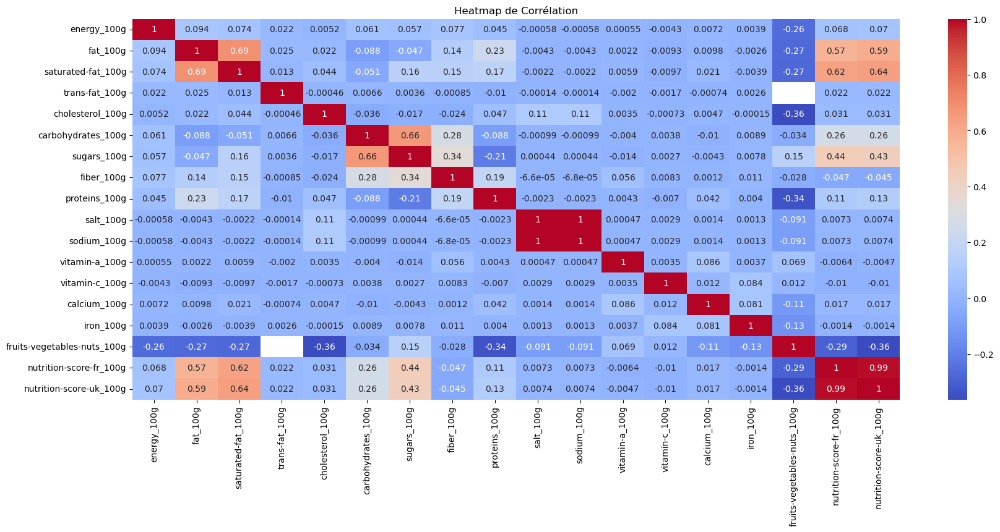

In [175]:
# Calculer la matrice de corrélation
correlation_matrix = OpenFoodProducts_nutrition_facts.corr()

# Créer la heatmap de corrélation
plt.figure(figsize=(20, 8))
sns.heatmap(correlation_matrix,annot=True, cmap='coolwarm')
plt.title("Heatmap de Corrélation")
plt.show()

On voit que certaines valeurs nutritionnelles sont corrélées, et donc on pourrait s'imaginer d'en garder qu'un seul. De même, certaines valeurs sont corrélées à 1, ce qui signifie que les deux valeurs se comportent exactement de la même façon. 
Dans le cadre de notre analyse, on va se concentrer particulièrement sur les données relatives au nutriscore FR. Selon le site : https://quoidansmonassiette.fr/comment-est-calcule-le-nutri-score-logo-nutritionnel/ , le nutriscore est calculé à partir des données suivantes : 
- Energie : 'energy_100g'
- les acides gras saturés (g/100g) : 'saturated-fat_100g'
- les sucres simples (g/100g) : 'sugars_100g'
- le sel (mg/100g) : 'sodium_100g' ou 'salt_100g', mais on prendre le salt car il y a le pourcentage de remplissage de sel > que celui du sodiul
- les fibres (g/100g) : 'fiber_100g'
- les protéines (g/100g) : 'proteins_100g' 
- les fruits et légumes : 'fruits-vegetables-nuts_100g'
- légumineuses et fruits à coque (g/100g) : 'fruits-vegetables-nuts_100g'
Donc on réduira le tableau à ces principales données + 'nutrition-score-fr_100g'

In [176]:
OpenFoodProducts_nutrition_facts_kept = ['energy_100g','saturated-fat_100g','sugars_100g','salt_100g','fiber_100g','proteins_100g','fruits-vegetables-nuts_100g','nutrition-score-fr_100g'] 
OpenFoodProducts_nutrition_facts=OpenFoodProducts_nutrition_facts[OpenFoodProducts_nutrition_facts_kept]

In [177]:
OpenFoodProducts_nutrition_facts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 8 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   energy_100g                  261113 non-null  float64
 1   saturated-fat_100g           229554 non-null  float64
 2   sugars_100g                  244971 non-null  float64
 3   salt_100g                    255510 non-null  float64
 4   fiber_100g                   200886 non-null  float64
 5   proteins_100g                259922 non-null  float64
 6   fruits-vegetables-nuts_100g  3036 non-null    float64
 7   nutrition-score-fr_100g      221210 non-null  float64
dtypes: float64(8)
memory usage: 19.6 MB


In [178]:
OpenFoodProducts_nutrition_facts.head()

,energy_100g,saturated-fat_100g,sugars_100g,salt_100g,fiber_100g,proteins_100g,fruits-vegetables-nuts_100g,nutrition-score-fr_100g
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2243.0,28.57,14.29,0.00000,3.6,3.57,NaN,14.0
2,1941.0,0.00,17.86,0.63500,7.1,17.86,NaN,0.0
3,2540.0,5.36,3.57,1.22428,7.1,17.86,NaN,12.0
4,1552.0,NaN,NaN,NaN,5.7,8.57,NaN,NaN


Pour des raisons pratiques, j'ai décidé d'en faire 2 dataframes, un pour une étude sur les infos plus globales "OpenFoodProducts_short" et un autre, si on souhaite rentrer dans le détails des ingrédiants car contenant plusieurs infos "OpenFoodProducts_details

J'ai à présent mes 3 dataframes 'propres' que je peux utiliser pour mon analyse. 

# Analyse univariée des différentes valeurs. 

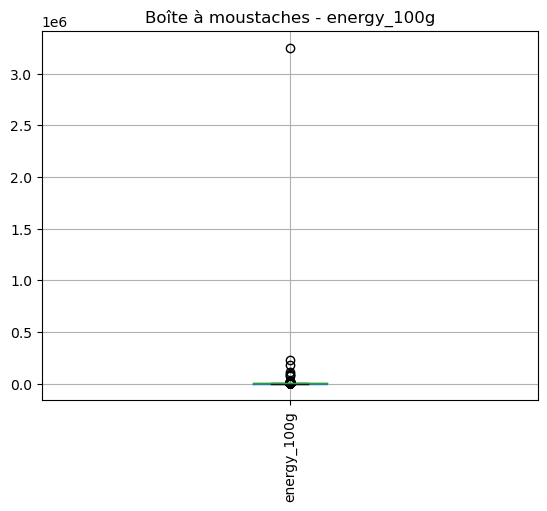

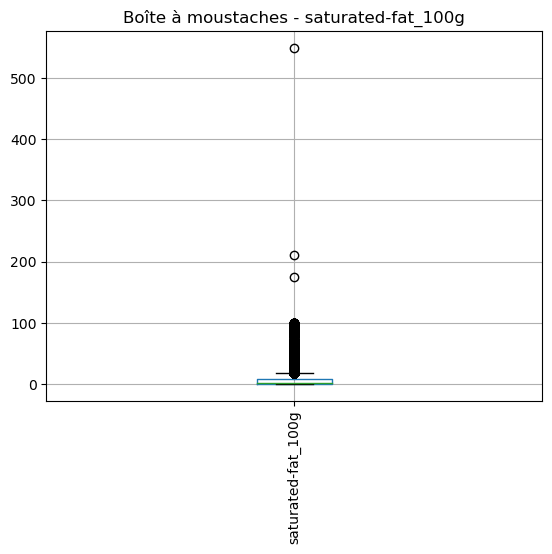

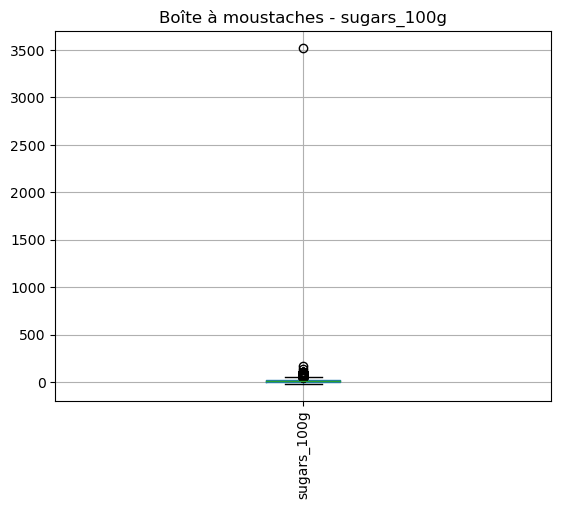

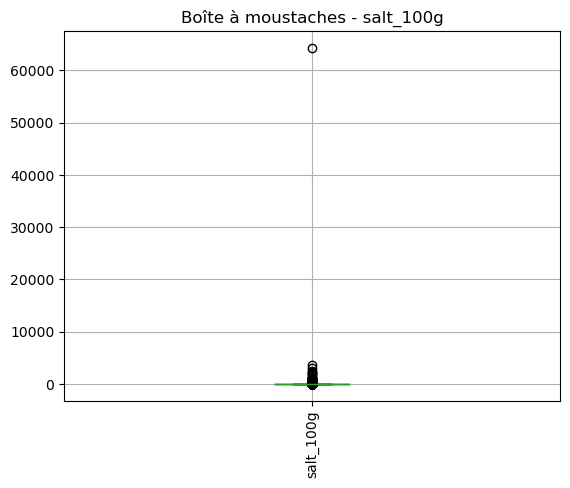

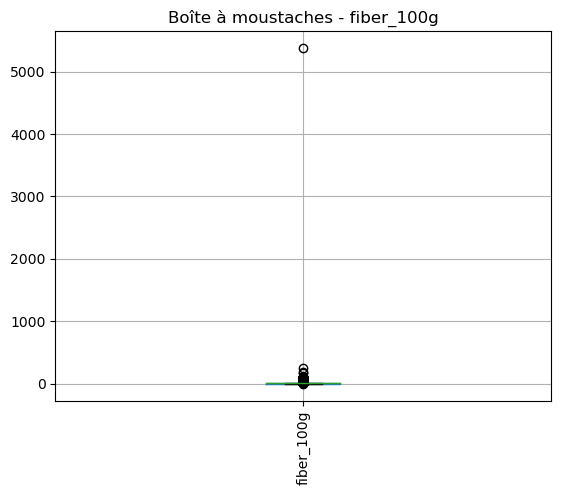

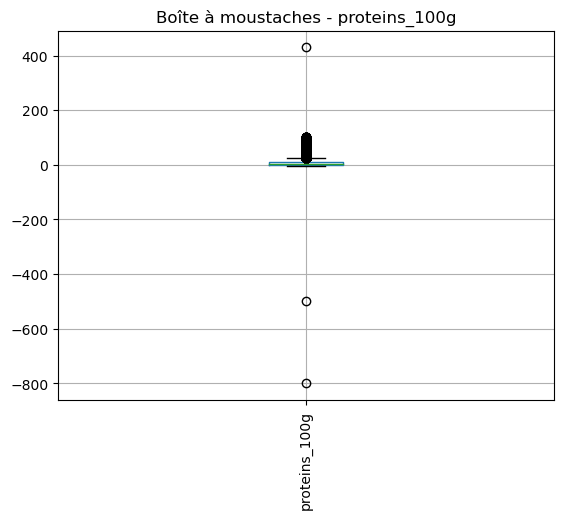

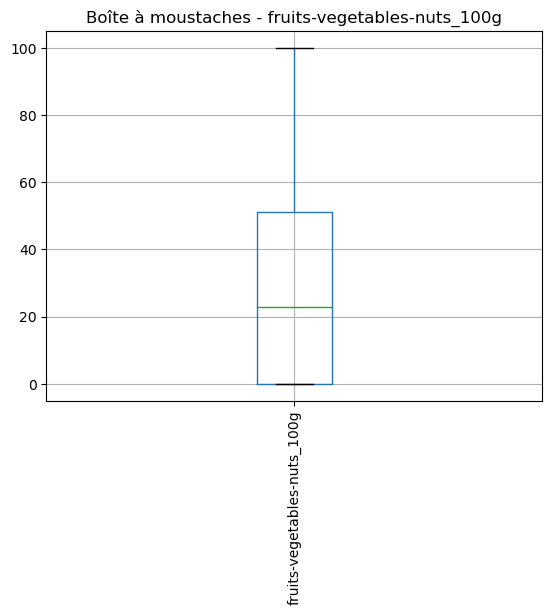

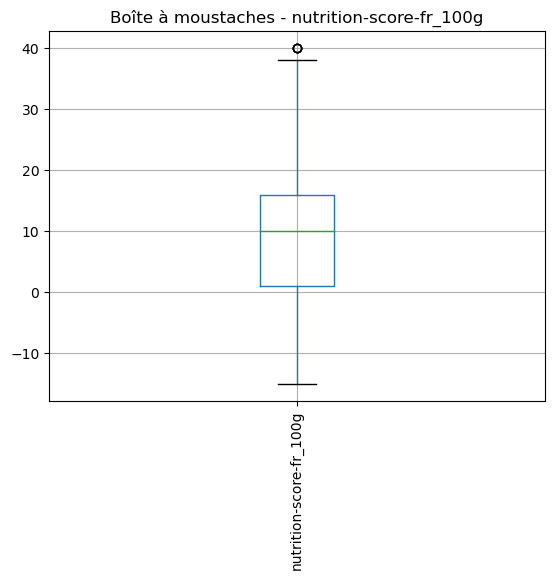

In [179]:
# Boucle pour parcourir chaque colonne du dataframe
for i in OpenFoodProducts_nutrition_facts.columns:
    # Vérifiez le type pour chaque colonne
    if pd.api.types.is_numeric_dtype(OpenFoodProducts_nutrition_facts[i]):
        # Si la colonne est de type numérique, je souhaiterai générer une boite à moustache
        OpenFoodProducts_nutrition_facts.boxplot(column=i)
        plt.xticks(rotation='vertical') 
        plt.title(f"Boîte à moustaches - {i}")
        plt.show()
    else:
        # Sinon générer un graphe en barres, et n'afficher que les 10 valeurs les plus récurrentes
        Valeurs = OpenFoodProducts_nutrition_facts[i].value_counts().nlargest(30)
        Autres = OpenFoodProducts_nutrition_facts[i].value_counts().nsmallest(len(OpenFoodProducts_short[i].unique()) - 10).sum()
        plt.xticks(rotation='vertical') 
        plt.bar(Valeurs.index, Valeurs.values)
        plt.title(f"Graphique à barres - {i}")
        
        if Autres > 0:
            plt.bar("Autres", Autres)
        
        plt.show()


Pour le travail demandé et pour les données qu'on a traitées ici, on pourra difficilement en retirer des infos de ce dataframe dans un premier lieu. Etudions maintenant le 2ème dataframes des ingrédients

In [180]:
# Liste des colonnes numériques
colonnes_numeriques = OpenFoodProducts_nutrition_facts.select_dtypes(include=[np.number]).columns

In [181]:
# Suppression des lignes dont toutes les valeurs sont nulles. 
OpenFoodProducts_nutrition_facts= OpenFoodProducts_nutrition_facts.dropna(how='all')

In [182]:
OpenFoodProducts_nutrition_facts.tail()

,energy_100g,saturated-fat_100g,sugars_100g,salt_100g,fiber_100g,proteins_100g,fruits-vegetables-nuts_100g,nutrition-score-fr_100g
320756,569.0,NaN,9.60,1.1000,1.1,2.10,NaN,NaN
320757,2406.0,3.73,3.89,0.1000,12.2,21.22,NaN,0.0
320763,21.0,0.20,0.50,0.0254,0.2,0.50,NaN,2.0
320768,0.0,0.00,0.00,0.0000,0.0,0.00,NaN,0.0
320771,2092.0,NaN,0.00,0.0000,NaN,0.00,NaN,NaN


In [183]:
OpenFoodProducts_nutrition_facts.describe()

,energy_100g,saturated-fat_100g,sugars_100g,salt_100g,fiber_100g,proteins_100g,fruits-vegetables-nuts_100g,nutrition-score-fr_100g
count,2.611130e+05,229554.000000,244971.000000,255510.000000,200886.000000,259922.000000,3036.000000,221210.000000
mean,1.141915e+03,5.129932,16.003484,2.028624,2.862111,7.075940,31.458587,9.165535
std,6.447154e+03,8.014238,22.327284,128.269454,12.867578,8.409054,31.967918,9.055903
min,0.000000e+00,0.000000,-17.860000,0.000000,-6.700000,-800.000000,0.000000,-15.000000
25%,3.770000e+02,0.000000,1.300000,0.063500,0.000000,0.700000,0.000000,1.000000
50%,1.100000e+03,1.790000,5.710000,0.581660,1.500000,4.760000,23.000000,10.000000
75%,1.674000e+03,7.140000,24.000000,1.374140,3.600000,10.000000,51.000000,16.000000
max,3.251373e+06,550.000000,3520.000000,64312.800000,5380.000000,430.000000,100.000000,40.000000


In [184]:
OpenFoodProducts_details=OpenFoodProducts_nutrition_facts

In [185]:
# Remplacer toutes les valeurs énergetiques supérieures à 3700
OpenFoodProducts_details.loc[OpenFoodProducts_details['energy_100g'] >= 3700, 'energy_100g'] = np.nan

In [186]:
OpenFoodProducts_details.describe()

,energy_100g,saturated-fat_100g,sugars_100g,salt_100g,fiber_100g,proteins_100g,fruits-vegetables-nuts_100g,nutrition-score-fr_100g
count,260219.000000,229554.000000,244971.000000,255510.000000,200886.000000,259922.000000,3036.000000,221210.000000
mean,1116.159059,5.129932,16.003484,2.028624,2.862111,7.075940,31.458587,9.165535
std,784.412709,8.014238,22.327284,128.269454,12.867578,8.409054,31.967918,9.055903
min,0.000000,0.000000,-17.860000,0.000000,-6.700000,-800.000000,0.000000,-15.000000
25%,372.000000,0.000000,1.300000,0.063500,0.000000,0.700000,0.000000,1.000000
50%,1096.000000,1.790000,5.710000,0.581660,1.500000,4.760000,23.000000,10.000000
75%,1674.000000,7.140000,24.000000,1.374140,3.600000,10.000000,51.000000,16.000000
max,3699.000000,550.000000,3520.000000,64312.800000,5380.000000,430.000000,100.000000,40.000000


In [187]:
colonnes_numeriques_wo_energy = colonnes_numeriques.drop('energy_100g')

In [188]:
colonnes_numeriques_wo_energy = colonnes_numeriques_wo_energy.drop('nutrition-score-fr_100g')

In [189]:
print(colonnes_numeriques_wo_energy)

Index(['saturated-fat_100g', 'sugars_100g', 'salt_100g', 'fiber_100g',
       'proteins_100g', 'fruits-vegetables-nuts_100g'],
      dtype='object')


In [190]:
# Remplacement des valeurs supérieures à 100 dans les autres colonnes numériques
OpenFoodProducts_details.loc[:, colonnes_numeriques_wo_energy] = OpenFoodProducts_details.loc[:, colonnes_numeriques_wo_energy].where(OpenFoodProducts_details.loc[:, colonnes_numeriques_wo_energy] <= 100, np.nan)

In [191]:
# Remplacement des valeurs inférieures à 0 dans les autres colonnes numériques
OpenFoodProducts_details.loc[:, colonnes_numeriques_wo_energy] = OpenFoodProducts_details.loc[:, colonnes_numeriques_wo_energy].where(OpenFoodProducts_details.loc[:, colonnes_numeriques_wo_energy]>0, np.nan)

In [192]:
OpenFoodProducts_details.describe()

,energy_100g,saturated-fat_100g,sugars_100g,salt_100g,fiber_100g,proteins_100g,fruits-vegetables-nuts_100g,nutrition-score-fr_100g
count,260219.000000,160815.000000,207875.000000,2.211780e+05,132048.000000,206287.000000,2074.000000,221210.000000
mean,1116.159059,7.316862,18.836645,1.833934e+00,4.308964,8.919932,46.050275,9.165535
std,784.412709,8.565257,21.775376,6.673844e+00,5.065973,8.210266,28.703994,9.055903
min,0.000000,0.000100,0.000100,5.000000e-08,0.000100,0.000100,1.000000,-15.000000
25%,372.000000,1.540000,3.200000,1.524000e-01,1.500000,3.330000,20.350000,1.000000
50%,1096.000000,4.500000,9.100000,7.721600e-01,3.000000,6.670000,50.000000,10.000000
75%,1674.000000,10.700000,28.950000,1.524000e+00,5.400000,12.100000,63.000000,16.000000
max,3699.000000,100.000000,100.000000,1.000000e+02,100.000000,100.000000,100.000000,40.000000


In [193]:
# Suppression des lignes dont toutes les valeurs sont nulles. 
OpenFoodProducts_details= OpenFoodProducts_details.dropna(how='all')

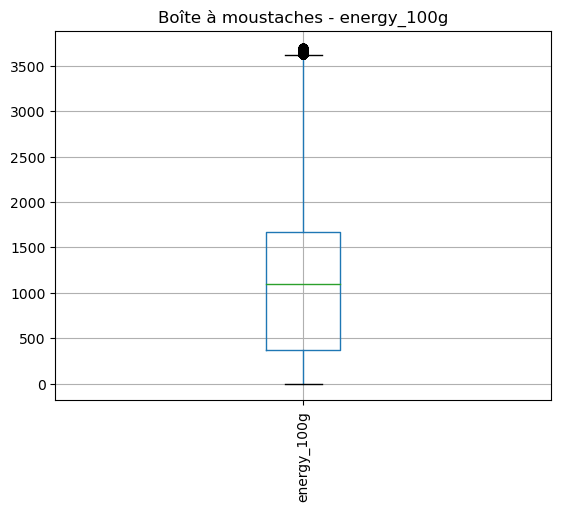

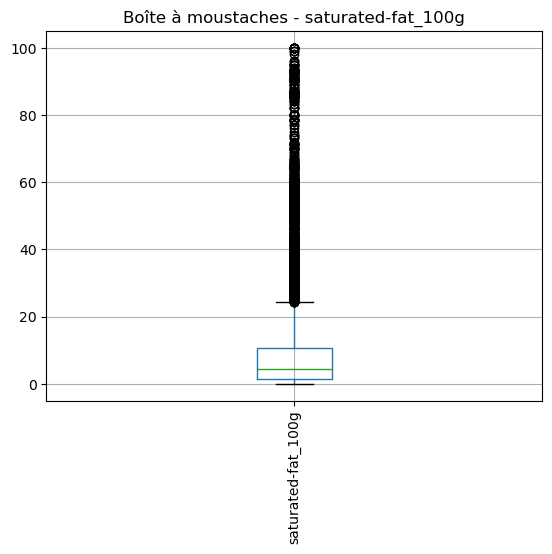

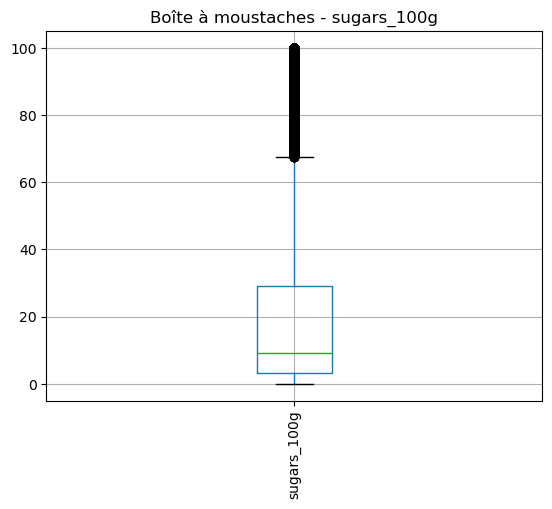

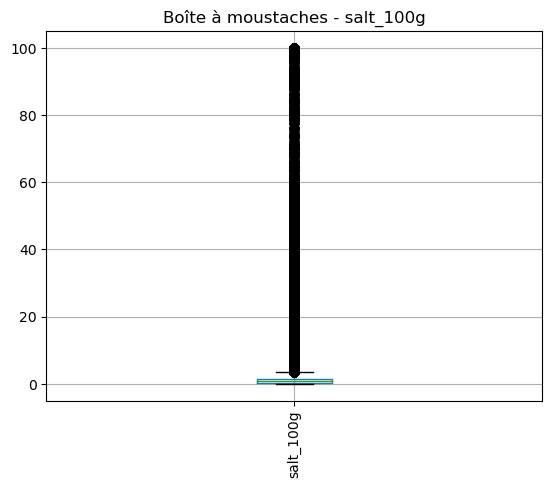

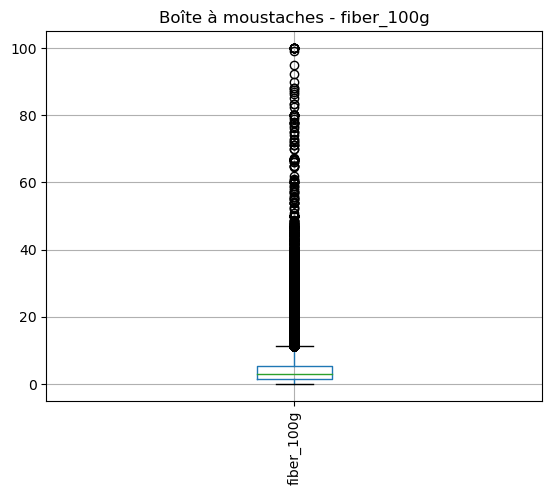

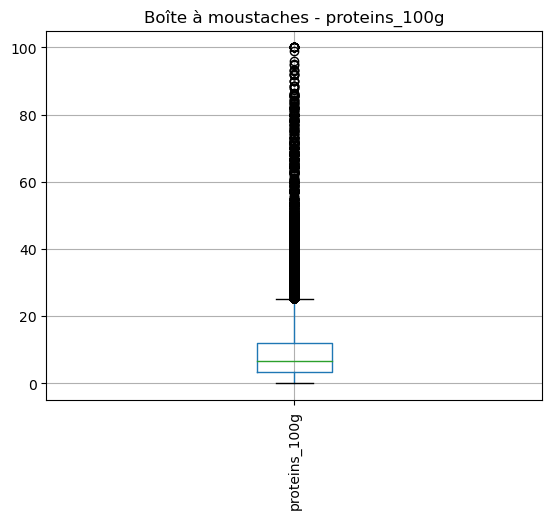

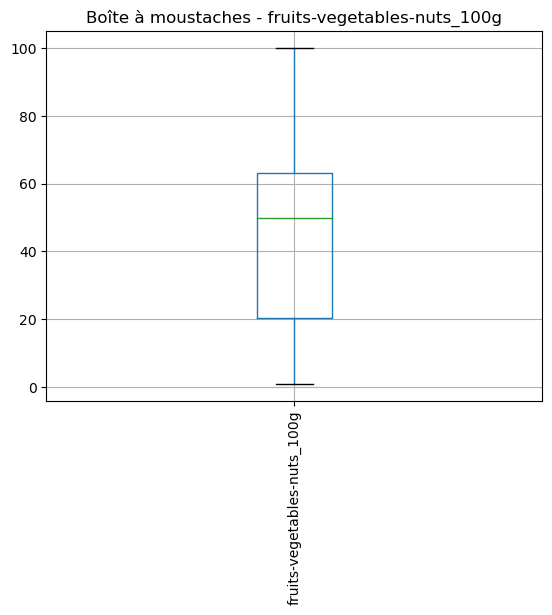

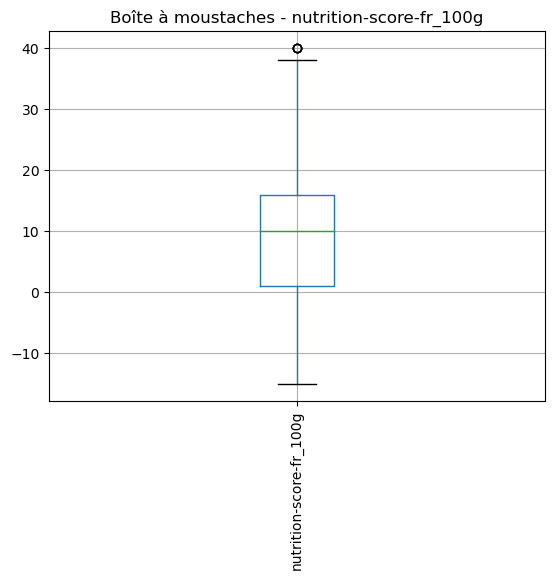

In [194]:
# Boucle pour parcourir chaque colonne du dataframe
for i in OpenFoodProducts_details.columns:
    # Vérifiez le type pour chaque colonne
    if pd.api.types.is_numeric_dtype(OpenFoodProducts_details[i]):
        # Si la colonne est de type numérique, je souhaiterai générer une boite à moustache
        OpenFoodProducts_details.boxplot(column=i)
        plt.xticks(rotation='vertical') 
        plt.title(f"Boîte à moustaches - {i}")
        plt.show()


In [195]:
OpenFoodProducts_details.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 262238 entries, 1 to 320771
Data columns (total 8 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   energy_100g                  260219 non-null  float64
 1   saturated-fat_100g           160815 non-null  float64
 2   sugars_100g                  207875 non-null  float64
 3   salt_100g                    221178 non-null  float64
 4   fiber_100g                   132048 non-null  float64
 5   proteins_100g                206287 non-null  float64
 6   fruits-vegetables-nuts_100g  2074 non-null    float64
 7   nutrition-score-fr_100g      221210 non-null  float64
dtypes: float64(8)
memory usage: 18.0 MB


In [196]:
OpenFoodProducts_details_short = OpenFoodProducts_details.iloc[:,list(range(-8, 0))]

In [197]:
OpenFoodProducts_details_short.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 262238 entries, 1 to 320771
Data columns (total 8 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   energy_100g                  260219 non-null  float64
 1   saturated-fat_100g           160815 non-null  float64
 2   sugars_100g                  207875 non-null  float64
 3   salt_100g                    221178 non-null  float64
 4   fiber_100g                   132048 non-null  float64
 5   proteins_100g                206287 non-null  float64
 6   fruits-vegetables-nuts_100g  2074 non-null    float64
 7   nutrition-score-fr_100g      221210 non-null  float64
dtypes: float64(8)
memory usage: 18.0 MB


In [198]:
OpenFoodProducts_details_short.head(20)

,energy_100g,saturated-fat_100g,sugars_100g,salt_100g,fiber_100g,proteins_100g,fruits-vegetables-nuts_100g,nutrition-score-fr_100g
1,2243.0,28.57,14.29,NaN,3.6,3.57,NaN,14.0
2,1941.0,NaN,17.86,0.63500,7.1,17.86,NaN,0.0
3,2540.0,5.36,3.57,1.22428,7.1,17.86,NaN,12.0
4,1552.0,NaN,NaN,NaN,5.7,8.57,NaN,NaN
5,1933.0,1.92,11.54,NaN,7.7,13.46,NaN,NaN
6,1490.0,NaN,NaN,NaN,NaN,8.89,NaN,NaN
7,1833.0,4.69,15.62,0.13970,9.4,14.06,NaN,7.0
8,2406.0,22.50,42.50,NaN,7.5,5.00,NaN,NaN
9,3586.0,7.14,NaN,NaN,NaN,NaN,NaN,NaN
10,1393.0,NaN,NaN,NaN,12.5,22.92,NaN,NaN


In [199]:
OpenFoodProducts_details_short = OpenFoodProducts_details_short.dropna(subset=['energy_100g', 'saturated-fat_100g', 'sugars_100g', 'salt_100g', 'fiber_100g', 'proteins_100g', 'fruits-vegetables-nuts_100g', 'nutrition-score-fr_100g'], how='all')


In [200]:
OpenFoodProducts_details_short.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 262238 entries, 1 to 320771
Data columns (total 8 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   energy_100g                  260219 non-null  float64
 1   saturated-fat_100g           160815 non-null  float64
 2   sugars_100g                  207875 non-null  float64
 3   salt_100g                    221178 non-null  float64
 4   fiber_100g                   132048 non-null  float64
 5   proteins_100g                206287 non-null  float64
 6   fruits-vegetables-nuts_100g  2074 non-null    float64
 7   nutrition-score-fr_100g      221210 non-null  float64
dtypes: float64(8)
memory usage: 18.0 MB


In [201]:
OpenFoodProducts_details_short.describe()

,energy_100g,saturated-fat_100g,sugars_100g,salt_100g,fiber_100g,proteins_100g,fruits-vegetables-nuts_100g,nutrition-score-fr_100g
count,260219.000000,160815.000000,207875.000000,2.211780e+05,132048.000000,206287.000000,2074.000000,221210.000000
mean,1116.159059,7.316862,18.836645,1.833934e+00,4.308964,8.919932,46.050275,9.165535
std,784.412709,8.565257,21.775376,6.673844e+00,5.065973,8.210266,28.703994,9.055903
min,0.000000,0.000100,0.000100,5.000000e-08,0.000100,0.000100,1.000000,-15.000000
25%,372.000000,1.540000,3.200000,1.524000e-01,1.500000,3.330000,20.350000,1.000000
50%,1096.000000,4.500000,9.100000,7.721600e-01,3.000000,6.670000,50.000000,10.000000
75%,1674.000000,10.700000,28.950000,1.524000e+00,5.400000,12.100000,63.000000,16.000000
max,3699.000000,100.000000,100.000000,1.000000e+02,100.000000,100.000000,100.000000,40.000000


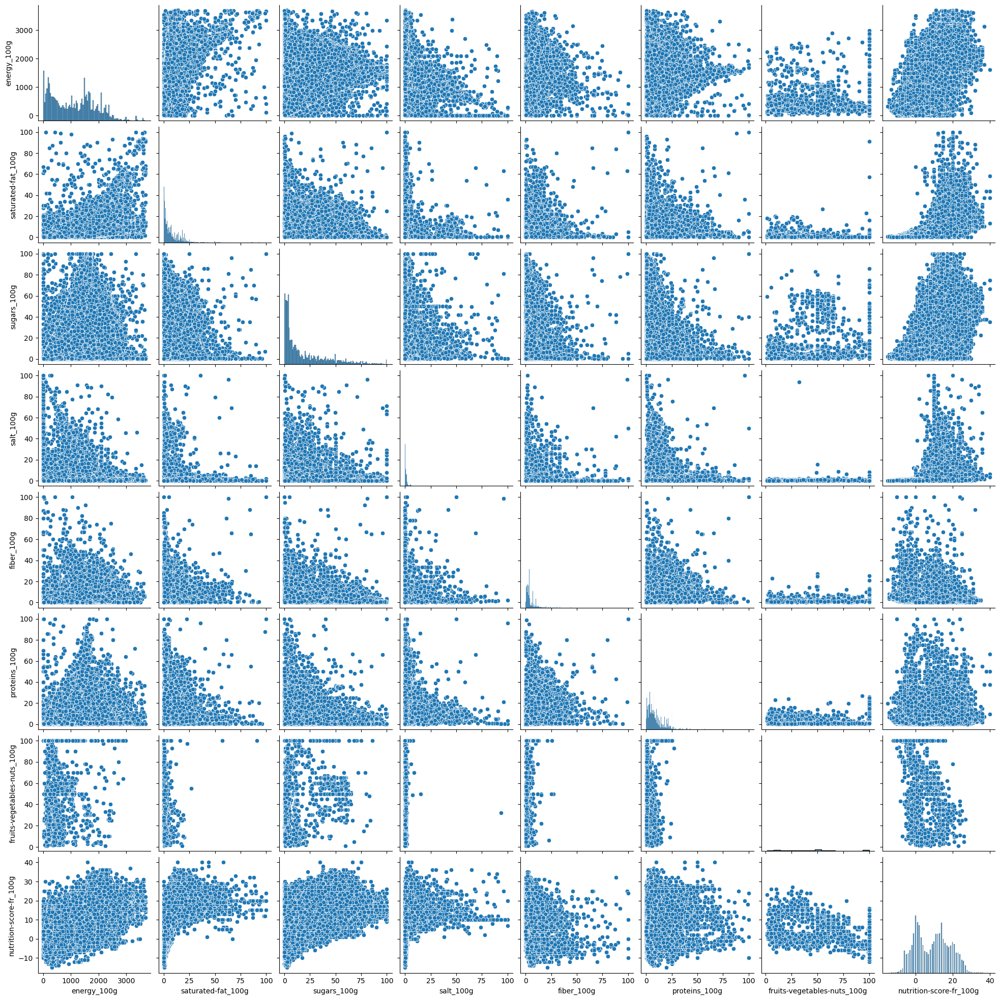

In [202]:
sns.pairplot(OpenFoodProducts_details_short)

In [203]:
OpenFoodProducts_details_apprentissage = OpenFoodProducts_details_short.dropna()

OpenFoodProducts_details_apprentissage = OpenFoodProducts_details.dropna(subset=[col for col in OpenFoodProducts_details_short.columns if col != "product name"])

In [204]:
OpenFoodProducts_details_apprentissage.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 751 entries, 283 to 317968
Data columns (total 8 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   energy_100g                  751 non-null    float64
 1   saturated-fat_100g           751 non-null    float64
 2   sugars_100g                  751 non-null    float64
 3   salt_100g                    751 non-null    float64
 4   fiber_100g                   751 non-null    float64
 5   proteins_100g                751 non-null    float64
 6   fruits-vegetables-nuts_100g  751 non-null    float64
 7   nutrition-score-fr_100g      751 non-null    float64
dtypes: float64(8)
memory usage: 52.8 KB


In [205]:
OpenFoodProducts_details_apprentissage.tail()

,energy_100g,saturated-fat_100g,sugars_100g,salt_100g,fiber_100g,proteins_100g,fruits-vegetables-nuts_100g,nutrition-score-fr_100g
316149,180.0,1.5,2.0,0.8382,0.70,1.0,36.0,4.0
316152,307.0,1.8,4.4,0.7700,0.50,1.2,57.0,3.0
317958,190.0,0.1,10.5,0.2540,0.10,0.2,25.0,15.0
317961,228.0,0.1,12.4,0.2540,0.51,0.3,43.9,16.0
317968,228.0,0.1,12.4,0.2540,0.51,0.3,43.9,16.0


In [206]:
from sklearn.linear_model import LinearRegression
X = OpenFoodProducts_details_apprentissage[['energy_100g','nutrition-score-fr_100g']]
y = OpenFoodProducts_details_apprentissage[colonnes_numeriques_wo_energy]
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8)

In [207]:
# Créez et entraînez un modèle de régression linéaire
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

# Prédisez les valeurs sur l'ensemble de test
y_pred = regression_model.predict(X_test)

In [208]:
from sklearn.metrics import mean_squared_error, r2_score

# Calculer l'erreur quadratique moyenne (RMSE)
rmse = mean_squared_error(y_test, y_pred, squared=False)
print("RMSE:", rmse)

# Calculer le coefficient de détermination (R2)
r2 = r2_score(y_test, y_pred)
print("R2 Score:", r2)

RMSE: 7.914798594812204
R2 Score: 0.23177575059751734


In [209]:
X = OpenFoodProducts_details_apprentissage[['energy_100g','nutrition-score-fr_100g','sugars_100g','salt_100g','proteins_100g' ]]
y2 = OpenFoodProducts_details_apprentissage[['fruits-vegetables-nuts_100g','fiber_100g', 'saturated-fat_100g']]
X_train, X_test, y2_train, y2_test = train_test_split(X, y2, train_size=0.8)

In [210]:
regression_model.fit(X_train, y2_train)

# Prédisez les valeurs sur l'ensemble de test
y2_pred = regression_model.predict(X_test)

In [211]:
# Calculer l'erreur quadratique moyenne (RMSE)
rmse2 = mean_squared_error(y2_test, y2_pred, squared=False)
print("RMSE-Nutri:", rmse2)

# Calculer le coefficient de détermination (R2)
r2bis = r2_score(y2_test, y2_pred)
print("R2 Score_NUTRI:", r2bis)

RMSE-Nutri: 9.28891121768437
R2 Score_NUTRI: 0.3560163172998007


In [212]:
from itertools import combinations
from termcolor import colored
columns = ['energy_100g', 'saturated-fat_100g', 'sugars_100g', 'salt_100g', 'fiber_100g', 'proteins_100g', 'fruits-vegetables-nuts_100g', 'nutrition-score-fr_100g']

for i in range(1, 5):
    column_combinations = combinations(columns, i)
    for combination in column_combinations:
        X = OpenFoodProducts_details_apprentissage.drop(columns=list(combination))
        y = OpenFoodProducts_details_apprentissage[list(combination)]
        X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8)
        
        regression_model = LinearRegression()
        regression_model.fit(X_train, y_train)
        
        y_pred = regression_model.predict(X_test)
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        r2 = r2_score(y_test, y_pred)
        
        
        if rmse < 10 and r2 > 0.7 :
            print(f"Columns: {combination}")
            print(colored("RMSE:", 'red'), colored(rmse, 'red'))
            print(colored("R2 Score:", 'red'), colored(r2, 'red'))
            print("------------------------")


Columns: ('nutrition-score-fr_100g',)
RMSE: 3.0954286012972125
R2 Score: 0.7324091847228912
------------------------


Columns: ('nutrition-score-fr_100g',)

Dans cette configuration, vous avez utilisé les autres colonnes pour prédire  la colonne 'nutrition-score-fr_100g', :
Le RMSE (Root Mean Square Error) est de 2.357804340700318. Cela signifie que l'erreur moyenne de prédiction entre les valeurs réelles et prédites est d'environ 2.357804340700318.
Le R2 Score est de 0.8050833278173718. Cela indique que votre modèle parvient à expliquer environ 80% de la variation la colonne "nutrition-score-fr_100g".


En résumé, les résultats montrent que votre modèle obtient des performances relativement bonnes pour cette configuration. on pourra proposer un modèle d'autosuggestion pour prédire le nutriscore en se basant sur les autres infos 

In [213]:
OpenFoodProducts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Columns: 162 entries, code to water-hardness_100g
dtypes: float64(106), object(56)
memory usage: 396.5+ MB


In [214]:
OpenFoodProducts_sample = OpenFoodProducts[['product_name','nutrition-score-fr_100g']]

In [215]:
OpenFoodProducts_sample.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 2 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   product_name             303010 non-null  object 
 1   nutrition-score-fr_100g  221210 non-null  float64
dtypes: float64(1), object(1)
memory usage: 4.9+ MB


In [216]:
OpenFoodProducts_sample.head(20)

,product_name,nutrition-score-fr_100g
0,Farine de blé noir,NaN
1,Banana Chips Sweetened (Whole),14.0
2,Peanuts,0.0
3,Organic Salted Nut Mix,12.0
4,Organic Polenta,NaN
5,Breadshop Honey Gone Nuts Granola,NaN
6,Organic Long Grain White Rice,NaN
7,Organic Muesli,7.0
8,Organic Dark Chocolate Minis,NaN
9,Organic Sunflower Oil,NaN


In [217]:
OpenFoodProducts_sample=OpenFoodProducts_sample.dropna(axis=0)

In [218]:
OpenFoodProducts_sample.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 218463 entries, 1 to 320768
Data columns (total 2 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   product_name             218463 non-null  object 
 1   nutrition-score-fr_100g  218463 non-null  float64
dtypes: float64(1), object(1)
memory usage: 5.0+ MB


In [219]:
grouped_data = OpenFoodProducts_sample.groupby('product_name')
anova_result = f_oneway(*[group['nutrition-score-fr_100g'] for name, group in grouped_data])

# Afficher les résultats de l'ANOVA
print("Valeur F :", anova_result.statistic)
print("p-value :", anova_result.pvalue)

Valeur F : 10.730730554555803
p-value : 0.0


Dans notre cas, avec une "Valeur F" de 10.730730554555803 et une "p-value" de 0.0, nous pouvons conclure que les scores nutritionnels des différents groupes (groupe A et groupe B) sont significativement différents, avec une grande confiance dans cette conclusion.

In [220]:
OpenFoodProducts_sample_energy = OpenFoodProducts[['product_name','energy_100g']]

In [221]:
OpenFoodProducts_sample_energy=OpenFoodProducts_sample_energy.dropna(axis=0)

In [222]:
OpenFoodProducts_sample_energy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 257773 entries, 1 to 320771
Data columns (total 2 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   product_name  257773 non-null  object 
 1   energy_100g   257773 non-null  float64
dtypes: float64(1), object(1)
memory usage: 5.9+ MB


In [223]:
grouped_data = OpenFoodProducts_sample_energy.groupby('product_name')
anova_result = f_oneway(*[group['energy_100g'] for name, group in grouped_data])

# Afficher les résultats de l'ANOVA
print("Valeur F :", anova_result.statistic)
print("p-value :", anova_result.pvalue)

Valeur F : 0.04882321605974633
p-value : 0.9999999999999999


En résumé, avec une "Valeur F" proche de zéro et une "p-value" très proche de 1, nous pouvons conclure qu'il n'y a pas de différence significative entre les énergies des deux groupes et que toute petite variation observée est très probablement due au hasard. C'est pour cette raison que je décide de compléter mon set précédent par la moyenne des énergies pour les produits qui n'ont pas d'énergie

In [224]:
# On imputera les énergies manquantes par la moyenne, car la différence de groupe est non significative
imputer = SimpleImputer(strategy="mean")
OpenFoodProducts_details["energy_100g"] = imputer.fit_transform(OpenFoodProducts_details[["energy_100g"]])

/var/folders/7b/9clccc0960v7tsff315g71dh0000gn/T/ipykernel_8297/3659680452.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  OpenFoodProducts_details["energy_100g"] = imputer.fit_transform(OpenFoodProducts_details[["energy_100g"]])


In [225]:
OpenFoodProducts_details.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 262238 entries, 1 to 320771
Data columns (total 8 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   energy_100g                  262238 non-null  float64
 1   saturated-fat_100g           160815 non-null  float64
 2   sugars_100g                  207875 non-null  float64
 3   salt_100g                    221178 non-null  float64
 4   fiber_100g                   132048 non-null  float64
 5   proteins_100g                206287 non-null  float64
 6   fruits-vegetables-nuts_100g  2074 non-null    float64
 7   nutrition-score-fr_100g      221210 non-null  float64
dtypes: float64(8)
memory usage: 18.0 MB


In [226]:
OpenFoodProducts_details.tail()

,energy_100g,saturated-fat_100g,sugars_100g,salt_100g,fiber_100g,proteins_100g,fruits-vegetables-nuts_100g,nutrition-score-fr_100g
320756,569.0,NaN,9.60,1.1000,1.1,2.10,NaN,NaN
320757,2406.0,3.73,3.89,0.1000,12.2,21.22,NaN,0.0
320763,21.0,0.20,0.50,0.0254,0.2,0.50,NaN,2.0
320768,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0
320771,2092.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [227]:
OpenFoodProducts_details_short=OpenFoodProducts_details

In [228]:
# Création de l'objet IterativeImputer
imputer = IterativeImputer()
# Stockez les noms des colonnes
colonne_names = {i: nom for i, nom in enumerate(OpenFoodProducts_details_short.columns)}

# Création de l'objet IterativeImputer en spécifiant les colonnes à imputer
columns_to_impute = ['energy_100g', 'saturated-fat_100g', 'sugars_100g', 'proteins_100g']
imputer = IterativeImputer(add_indicator=False, missing_values=np.nan, random_state=0)

# Imputer uniquement les colonnes sélectionnées
OpenFoodProducts_details_short_filled = OpenFoodProducts_details_short.copy()
OpenFoodProducts_details_short_filled[columns_to_impute] = imputer.fit_transform(OpenFoodProducts_details_short[columns_to_impute])

In [229]:
OpenFoodProducts_details_short_filled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 262238 entries, 1 to 320771
Data columns (total 8 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   energy_100g                  262238 non-null  float64
 1   saturated-fat_100g           262238 non-null  float64
 2   sugars_100g                  262238 non-null  float64
 3   salt_100g                    221178 non-null  float64
 4   fiber_100g                   132048 non-null  float64
 5   proteins_100g                262238 non-null  float64
 6   fruits-vegetables-nuts_100g  2074 non-null    float64
 7   nutrition-score-fr_100g      221210 non-null  float64
dtypes: float64(8)
memory usage: 18.0 MB


In [230]:
# Création de l'objet KNNImputer en spécifiant les colonnes à imputer
columns_to_impute_knn = ['salt_100g']
knn_imputer = KNNImputer(n_neighbors=5)

# Imputer les colonnes sélectionnées avec KNN
OpenFoodProducts_details_short_filled[columns_to_impute_knn] = knn_imputer.fit_transform(OpenFoodProducts_details_short_filled[columns_to_impute_knn])

In [231]:
OpenFoodProducts_details_short_filled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 262238 entries, 1 to 320771
Data columns (total 8 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   energy_100g                  262238 non-null  float64
 1   saturated-fat_100g           262238 non-null  float64
 2   sugars_100g                  262238 non-null  float64
 3   salt_100g                    262238 non-null  float64
 4   fiber_100g                   132048 non-null  float64
 5   proteins_100g                262238 non-null  float64
 6   fruits-vegetables-nuts_100g  2074 non-null    float64
 7   nutrition-score-fr_100g      221210 non-null  float64
dtypes: float64(8)
memory usage: 18.0 MB


In [232]:
# Création de l'objet KNNImputer en spécifiant les colonnes à imputer
columns_to_impute_knn = ['nutrition-score-fr_100g']
knn_imputer = KNNImputer(n_neighbors=5)

# Imputer les colonnes sélectionnées avec KNN
OpenFoodProducts_details_short_filled[columns_to_impute_knn] = knn_imputer.fit_transform(OpenFoodProducts_details_short_filled[columns_to_impute_knn])

In [233]:
OpenFoodProducts_details_short_filled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 262238 entries, 1 to 320771
Data columns (total 8 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   energy_100g                  262238 non-null  float64
 1   saturated-fat_100g           262238 non-null  float64
 2   sugars_100g                  262238 non-null  float64
 3   salt_100g                    262238 non-null  float64
 4   fiber_100g                   132048 non-null  float64
 5   proteins_100g                262238 non-null  float64
 6   fruits-vegetables-nuts_100g  2074 non-null    float64
 7   nutrition-score-fr_100g      262238 non-null  float64
dtypes: float64(8)
memory usage: 18.0 MB


In [234]:
# On imputera les énergies manquantes par la moyenne, car la différence de groupe est non significative
imputer = SimpleImputer(strategy="median")
OpenFoodProducts_details_short_filled["fiber_100g"] = imputer.fit_transform(OpenFoodProducts_details_short_filled[["fiber_100g"]])

In [235]:
# On imputera les énergies manquantes par la moyenne, car la différence de groupe est non significative
imputer = SimpleImputer(strategy="median")
OpenFoodProducts_details_short_filled["fruits-vegetables-nuts_100g"] = imputer.fit_transform(OpenFoodProducts_details_short_filled[["fruits-vegetables-nuts_100g"]])

In [236]:
OpenFoodProducts_details_short_filled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 262238 entries, 1 to 320771
Data columns (total 8 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   energy_100g                  262238 non-null  float64
 1   saturated-fat_100g           262238 non-null  float64
 2   sugars_100g                  262238 non-null  float64
 3   salt_100g                    262238 non-null  float64
 4   fiber_100g                   262238 non-null  float64
 5   proteins_100g                262238 non-null  float64
 6   fruits-vegetables-nuts_100g  262238 non-null  float64
 7   nutrition-score-fr_100g      262238 non-null  float64
dtypes: float64(8)
memory usage: 18.0 MB


In [237]:
OpenFoodProducts_details_short.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 262238 entries, 1 to 320771
Data columns (total 8 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   energy_100g                  262238 non-null  float64
 1   saturated-fat_100g           160815 non-null  float64
 2   sugars_100g                  207875 non-null  float64
 3   salt_100g                    221178 non-null  float64
 4   fiber_100g                   132048 non-null  float64
 5   proteins_100g                206287 non-null  float64
 6   fruits-vegetables-nuts_100g  2074 non-null    float64
 7   nutrition-score-fr_100g      221210 non-null  float64
dtypes: float64(8)
memory usage: 18.0 MB


In [238]:
OpenFoodProducts_details_short.describe()

,energy_100g,saturated-fat_100g,sugars_100g,salt_100g,fiber_100g,proteins_100g,fruits-vegetables-nuts_100g,nutrition-score-fr_100g
count,262238.000000,160815.000000,207875.000000,2.211780e+05,132048.000000,206287.000000,2074.000000,221210.000000
mean,1116.159059,7.316862,18.836645,1.833934e+00,4.308964,8.919932,46.050275,9.165535
std,781.387222,8.565257,21.775376,6.673844e+00,5.065973,8.210266,28.703994,9.055903
min,0.000000,0.000100,0.000100,5.000000e-08,0.000100,0.000100,1.000000,-15.000000
25%,380.000000,1.540000,3.200000,1.524000e-01,1.500000,3.330000,20.350000,1.000000
50%,1105.000000,4.500000,9.100000,7.721600e-01,3.000000,6.670000,50.000000,10.000000
75%,1674.000000,10.700000,28.950000,1.524000e+00,5.400000,12.100000,63.000000,16.000000
max,3699.000000,100.000000,100.000000,1.000000e+02,100.000000,100.000000,100.000000,40.000000


In [239]:
OpenFoodProducts_details_short_filled.describe()

,energy_100g,saturated-fat_100g,sugars_100g,salt_100g,fiber_100g,proteins_100g,fruits-vegetables-nuts_100g,nutrition-score-fr_100g
count,262238.000000,262238.000000,262238.000000,2.622380e+05,262238.000000,262238.000000,262238.000000,262238.000000
mean,1116.159059,5.808243,17.063094,1.833934e+00,3.659119,7.850263,49.968762,9.165535
std,781.387222,7.361806,20.985441,6.129133e+00,3.653934,7.955946,2.575954,8.317373
min,0.000000,-1.090099,-145.600390,5.000000e-08,0.000100,-19.087709,1.000000,-15.000000
25%,380.000000,0.790000,3.196565,2.200000e-01,2.900000,3.200000,50.000000,2.000000
50%,1105.000000,3.570000,9.000000,1.000000e+00,3.000000,5.700000,50.000000,9.165535
75%,1674.000000,8.312285,26.000000,1.833934e+00,3.000000,10.710000,50.000000,15.000000
max,3699.000000,100.000000,100.000000,1.000000e+02,100.000000,100.000000,100.000000,40.000000


In [240]:
# On instancie notre scaler : 
scaler = StandardScaler()

# On le fit : 
scaler.fit(OpenFoodProducts_details_short_filled)

# On l'entraine : 
OpenFoodProducts_details_short_filled_scaled = scaler.transform(OpenFoodProducts_details_short_filled)

# On peut faire les 2 opérations en une ligne : 
OpenFoodProducts_details_short_filled_scaled = scaler.fit_transform(OpenFoodProducts_details_short_filled)

# On le transforme en DataFrame : 
OpenFoodProducts_details_short_filled_scaled = pd.DataFrame(OpenFoodProducts_details_short_filled_scaled)

# On peut appliquer la méthode .describe() et .round()
OpenFoodProducts_details_short_filled_scaled.describe()

,0,1,2,3,4,5,6,7
count,2.622380e+05,2.622380e+05,2.622380e+05,2.622380e+05,2.622380e+05,2.622380e+05,2.622380e+05,2.622380e+05
mean,3.828571e-17,-9.136887e-17,-2.890260e-16,-6.750126e-17,-3.354064e-16,7.662562e-17,9.418069e-16,1.169164e-16
std,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00
min,-1.428435e+00,-9.370467e-01,-7.751269e+00,-2.992164e-01,-1.001393e+00,-3.385898e+00,-1.900999e+01,-2.905434e+00
25%,-9.421199e-01,-6.816606e-01,-6.607702e-01,-2.633222e-01,-2.077542e-01,-5.845027e-01,1.212670e-02,-8.615159e-01
50%,-1.428111e-02,-3.040351e-01,-3.842240e-01,-1.360609e-01,-1.803864e-01,-2.702717e-01,1.212670e-02,2.135723e-16
75%,7.139124e-01,3.401403e-01,4.258630e-01,0.000000e+00,-1.803864e-01,3.594473e-01,1.212670e-02,7.014806e-01
max,3.305462e+00,1.279468e+01,3.952124e+00,1.601634e+01,2.636639e+01,1.158252e+01,1.942245e+01,3.707243e+00


In [241]:
OpenFoodProducts_details_short_filled_scaled.rename(columns=colonne_names, inplace=True)

In [242]:
OpenFoodProducts_details_short_filled_scaled.describe()

,energy_100g,saturated-fat_100g,sugars_100g,salt_100g,fiber_100g,proteins_100g,fruits-vegetables-nuts_100g,nutrition-score-fr_100g
count,2.622380e+05,2.622380e+05,2.622380e+05,2.622380e+05,2.622380e+05,2.622380e+05,2.622380e+05,2.622380e+05
mean,3.828571e-17,-9.136887e-17,-2.890260e-16,-6.750126e-17,-3.354064e-16,7.662562e-17,9.418069e-16,1.169164e-16
std,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00
min,-1.428435e+00,-9.370467e-01,-7.751269e+00,-2.992164e-01,-1.001393e+00,-3.385898e+00,-1.900999e+01,-2.905434e+00
25%,-9.421199e-01,-6.816606e-01,-6.607702e-01,-2.633222e-01,-2.077542e-01,-5.845027e-01,1.212670e-02,-8.615159e-01
50%,-1.428111e-02,-3.040351e-01,-3.842240e-01,-1.360609e-01,-1.803864e-01,-2.702717e-01,1.212670e-02,2.135723e-16
75%,7.139124e-01,3.401403e-01,4.258630e-01,0.000000e+00,-1.803864e-01,3.594473e-01,1.212670e-02,7.014806e-01
max,3.305462e+00,1.279468e+01,3.952124e+00,1.601634e+01,2.636639e+01,1.158252e+01,1.942245e+01,3.707243e+00


In [243]:
pca = PCA()

In [244]:
pca.fit(OpenFoodProducts_details_short_filled_scaled)

PCA()

In [245]:
pca.explained_variance_ratio_

array([0.31083892, 0.18948453, 0.12923424, 0.12528447, 0.11722778,
       0.05393171, 0.04545113, 0.02854722])

In [246]:
scree = (pca.explained_variance_ratio_*100).round(2)
scree

array([31.08, 18.95, 12.92, 12.53, 11.72,  5.39,  4.55,  2.85])

In [247]:
scree_cum = scree.cumsum().round()
scree_cum

array([ 31.,  50.,  63.,  75.,  87.,  93.,  97., 100.])

In [250]:
x_list = range(1, 9)
list(x_list)

[1, 2, 3, 4, 5, 6, 7, 8]

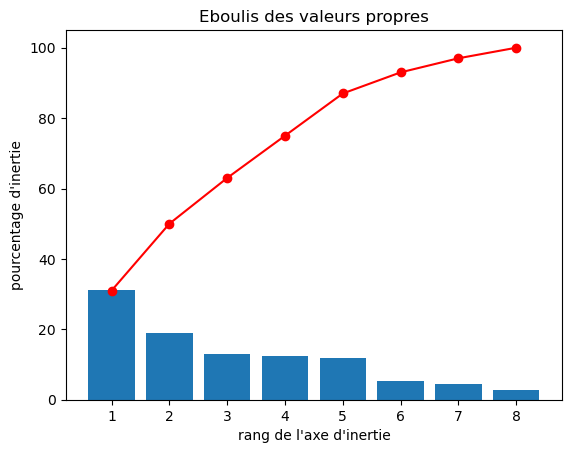

In [252]:
plt.bar(x_list, scree)
plt.plot(x_list, scree_cum,c="red",marker='o')
plt.xlabel("rang de l'axe d'inertie")
plt.ylabel("pourcentage d'inertie")
plt.title("Eboulis des valeurs propres")
plt.show(block=False)

On voit ici que près de 78% de la variance est comprise dans les 4 premières composantes, et près de 90% dans les 5 premières. On remarque aussi que les 7 premières composantes définissent automatiquement la dernière. 

In [253]:
pcs = pca.components_
pcs

array([[ 5.57703892e-01,  5.20515595e-01,  3.52089901e-01,
        -3.50481172e-02,  1.19568745e-01,  1.38826203e-01,
         5.30651947e-03,  5.09152882e-01],
       [ 1.20494152e-01,  7.66728881e-02, -5.41669059e-01,
         6.72896009e-02,  4.04396958e-01,  7.09789102e-01,
         2.57715648e-03, -1.19687335e-01],
       [-9.48550311e-02,  5.25672529e-02, -1.35608270e-01,
         8.55960064e-01, -3.71833949e-01,  8.34864859e-02,
        -1.40205402e-01,  2.68875323e-01],
       [-8.86094572e-04, -2.66359177e-02,  5.03527324e-02,
         2.18924140e-01,  9.80412236e-02, -4.09502186e-02,
         9.68171146e-01, -1.34979938e-02],
       [ 4.16841149e-02, -1.71901728e-01,  3.18129303e-01,
         4.31088889e-01,  7.44350862e-01, -2.38252841e-01,
        -2.06509485e-01, -1.67927241e-01],
       [-2.14547671e-01,  7.93883961e-01, -2.85513061e-01,
         5.32921923e-02,  9.74876575e-02, -3.77602866e-01,
        -5.51808965e-03, -2.95366840e-01],
       [-4.91612618e-01, -5.834391

In [254]:
pcs = pd.DataFrame(pcs)
pcs

,0,1,2,3,4,5,6,7
0,0.557704,0.520516,0.352090,-0.035048,0.119569,0.138826,0.005307,0.509153
1,0.120494,0.076673,-0.541669,0.067290,0.404397,0.709789,0.002577,-0.119687
2,-0.094855,0.052567,-0.135608,0.855960,-0.371834,0.083486,-0.140205,0.268875
3,-0.000886,-0.026636,0.050353,0.218924,0.098041,-0.040950,0.968171,-0.013498
4,0.041684,-0.171902,0.318129,0.431089,0.744351,-0.238253,-0.206509,-0.167927
5,-0.214548,0.793884,-0.285513,0.053292,0.097488,-0.377603,-0.005518,-0.295367
6,-0.491613,-0.058344,-0.254724,-0.157348,0.332731,-0.156614,0.016602,0.727844
7,-0.613187,0.237710,0.560441,-0.014571,-0.004677,0.494372,0.000205,-0.093616


In [255]:
pcs.rename(columns=colonne_names, inplace=True)
features = pcs.columns
pcs.index = [f"F{i}" for i in x_list]
pcs.round(2)

,energy_100g,saturated-fat_100g,sugars_100g,salt_100g,fiber_100g,proteins_100g,fruits-vegetables-nuts_100g,nutrition-score-fr_100g
F1,0.56,0.52,0.35,-0.04,0.12,0.14,0.01,0.51
F2,0.12,0.08,-0.54,0.07,0.40,0.71,0.00,-0.12
F3,-0.09,0.05,-0.14,0.86,-0.37,0.08,-0.14,0.27
F4,-0.00,-0.03,0.05,0.22,0.10,-0.04,0.97,-0.01
F5,0.04,-0.17,0.32,0.43,0.74,-0.24,-0.21,-0.17
F6,-0.21,0.79,-0.29,0.05,0.10,-0.38,-0.01,-0.30
F7,-0.49,-0.06,-0.25,-0.16,0.33,-0.16,0.02,0.73
F8,-0.61,0.24,0.56,-0.01,-0.00,0.49,0.00,-0.09


In [256]:
pcs.T

,F1,F2,F3,F4,F5,F6,F7,F8
energy_100g,0.557704,0.120494,-0.094855,-0.000886,0.041684,-0.214548,-0.491613,-0.613187
saturated-fat_100g,0.520516,0.076673,0.052567,-0.026636,-0.171902,0.793884,-0.058344,0.237710
sugars_100g,0.352090,-0.541669,-0.135608,0.050353,0.318129,-0.285513,-0.254724,0.560441
salt_100g,-0.035048,0.067290,0.855960,0.218924,0.431089,0.053292,-0.157348,-0.014571
fiber_100g,0.119569,0.404397,-0.371834,0.098041,0.744351,0.097488,0.332731,-0.004677
proteins_100g,0.138826,0.709789,0.083486,-0.040950,-0.238253,-0.377603,-0.156614,0.494372
fruits-vegetables-nuts_100g,0.005307,0.002577,-0.140205,0.968171,-0.206509,-0.005518,0.016602,0.000205
nutrition-score-fr_100g,0.509153,-0.119687,0.268875,-0.013498,-0.167927,-0.295367,0.727844,-0.093616


<Axes: >

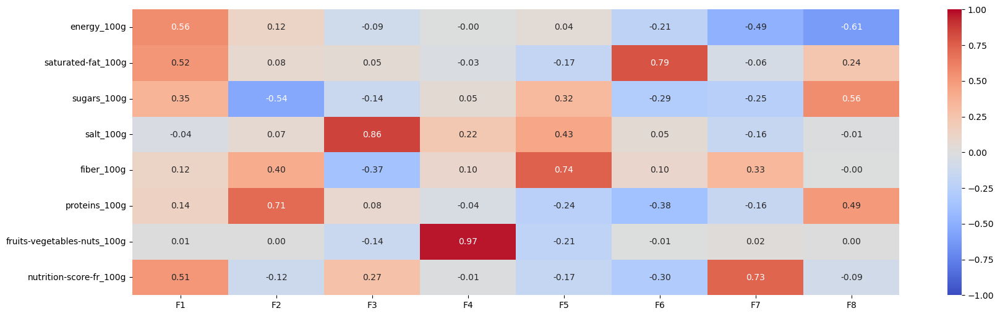

In [257]:
fig, ax = plt.subplots(figsize=(20, 6))
sns.heatmap(pcs.T, vmin=-1, vmax=1, annot=True, cmap="coolwarm", fmt="0.2f")

In [258]:
x, y = 0,1

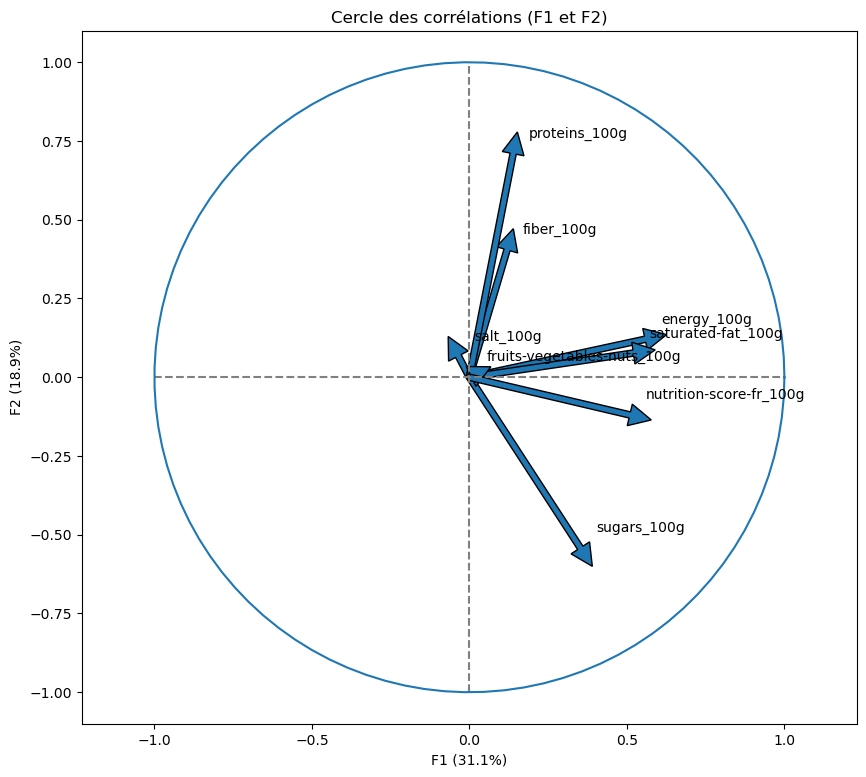

In [272]:
fig, ax = plt.subplots(figsize=(10, 9))
for i in range(0, pca.components_.shape[1]):
    ax.arrow(0,
             0,  # Start the arrow at the origin
             pca.components_[0, i],  #0 for PC1
             pca.components_[1, i],  #1 for PC2
             head_width=0.07,
             head_length=0.07, 
             width=0.02,              )

    plt.text(pca.components_[0, i] + 0.05,
            pca.components_[1, i] + 0.05,
            features[i])
    
# affichage des lignes horizontales et verticales
plt.plot([-1, 1], [0, 0], color='grey', ls='--')
plt.plot([0, 0], [-1, 1], color='grey', ls='--')


# nom des axes, avec le pourcentage d'inertie expliqué
plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))


an = np.linspace(0, 2 * np.pi, 100)
plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale
plt.axis('equal')
plt.show(block=False)

In [273]:
def correlation_graph(pca, 
                      x_y, 
                      features) : 
    """Affiche le graphe des correlations

    Positional arguments : 
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """

    # Extrait x et y 
    x,y=x_y

    # Taille de l'image (en inches)
    fig, ax = plt.subplots(figsize=(7, 6))

    # Pour chaque composante : 
    for i in range(0, pca.components_.shape[1]):

        # Les flèches
        ax.arrow(0,0, 
                pca.components_[x, i],  
                pca.components_[y, i],  
                head_width=0.07,
                head_length=0.07, 
                width=0.02, )

        # Les labels
        plt.text(pca.components_[x, i] + 0.05,
                pca.components_[y, i] + 0.05,
                features[i])
        
    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    # J'ai copié collé le code sans le lire
    plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))

    # Le cercle 
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display
    plt.axis('equal')
    plt.show(block=False)

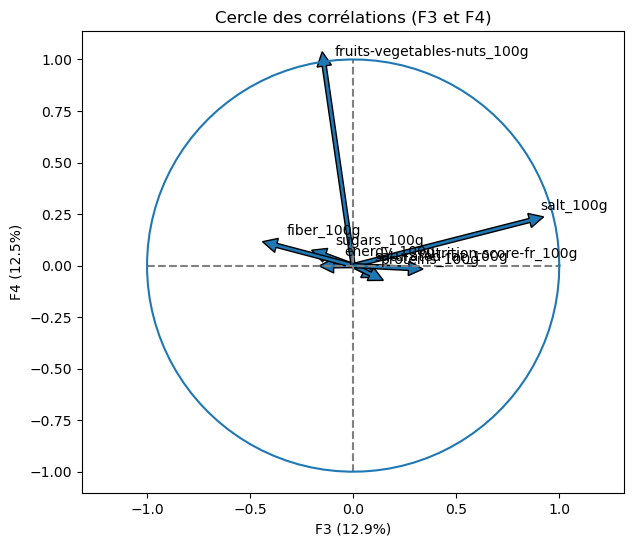

In [274]:
correlation_graph(pca, (2,3), features)

In [275]:
OpenFoodProducts_details.head(10)

,energy_100g,saturated-fat_100g,sugars_100g,salt_100g,fiber_100g,proteins_100g,fruits-vegetables-nuts_100g,nutrition-score-fr_100g
1,2243.0,28.57,14.29,NaN,3.6,3.57,NaN,14.0
2,1941.0,NaN,17.86,0.63500,7.1,17.86,NaN,0.0
3,2540.0,5.36,3.57,1.22428,7.1,17.86,NaN,12.0
4,1552.0,NaN,NaN,NaN,5.7,8.57,NaN,NaN
5,1933.0,1.92,11.54,NaN,7.7,13.46,NaN,NaN
6,1490.0,NaN,NaN,NaN,NaN,8.89,NaN,NaN
7,1833.0,4.69,15.62,0.13970,9.4,14.06,NaN,7.0
8,2406.0,22.50,42.50,NaN,7.5,5.00,NaN,NaN
9,3586.0,7.14,NaN,NaN,NaN,NaN,NaN,NaN
10,1393.0,NaN,NaN,NaN,12.5,22.92,NaN,NaN


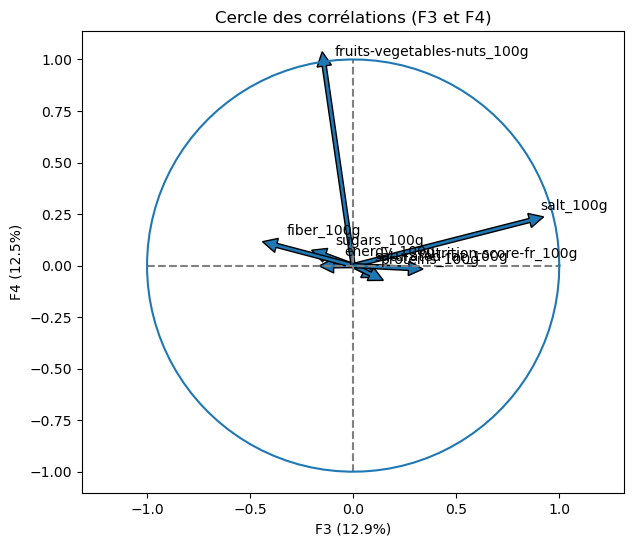

In [276]:
correlation_graph(pca, (2,3), features)

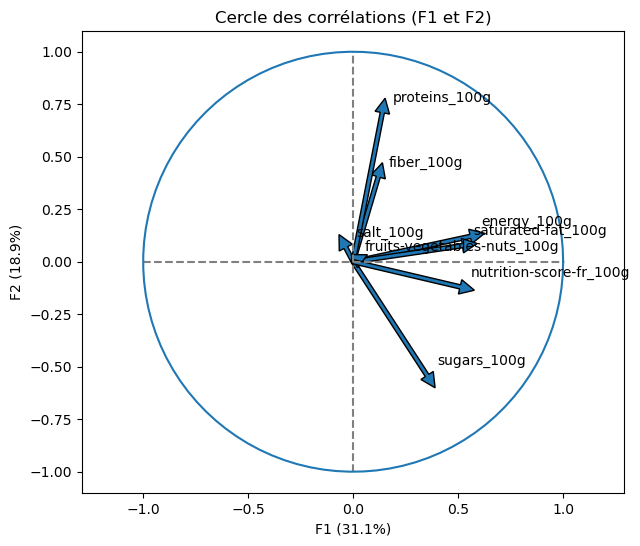

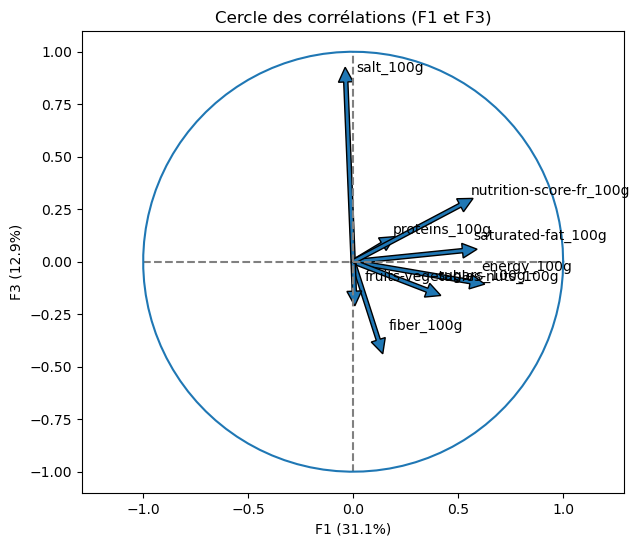

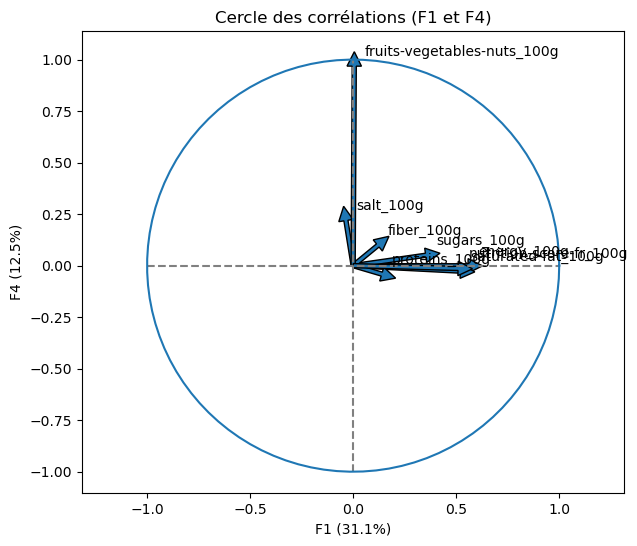

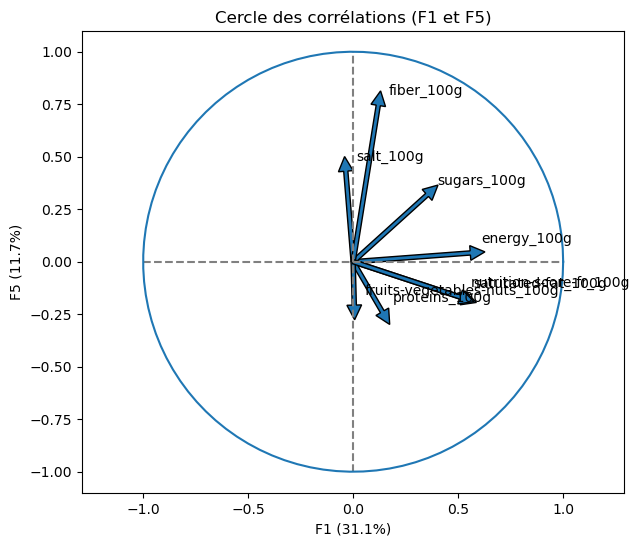

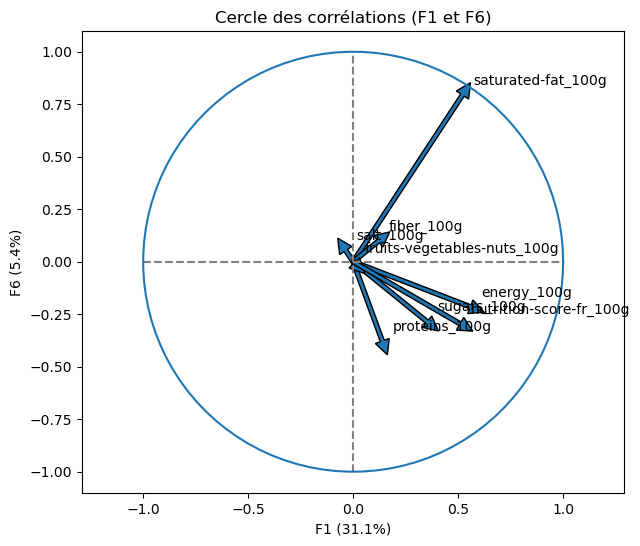

...

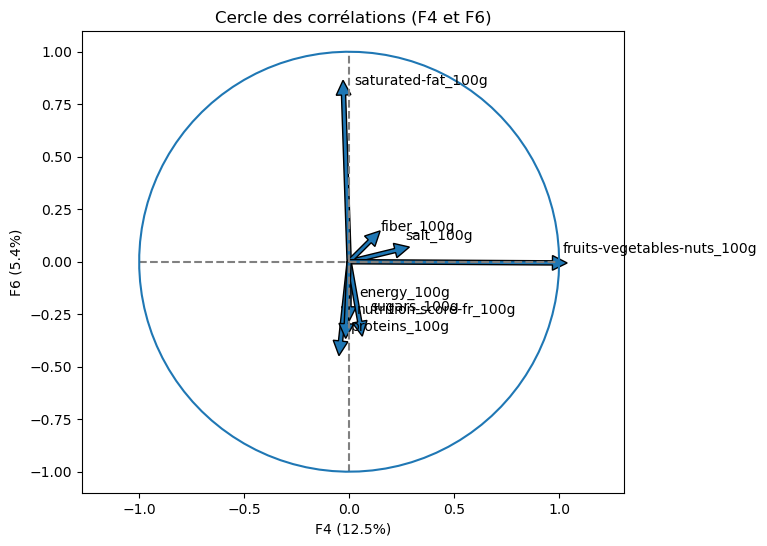

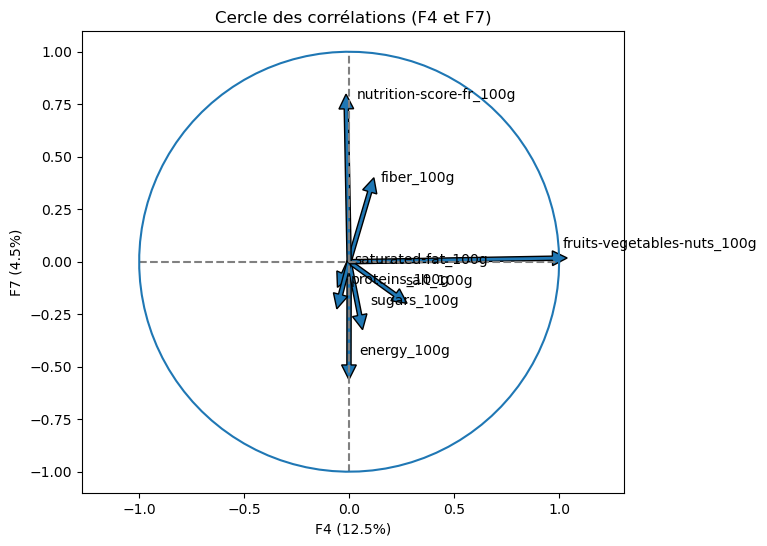

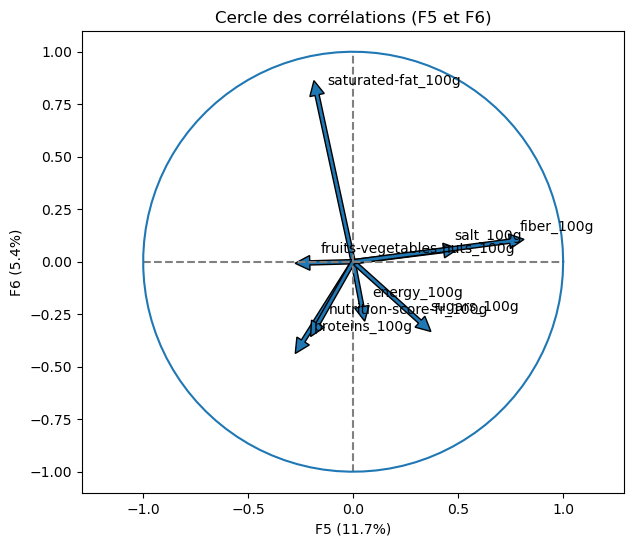

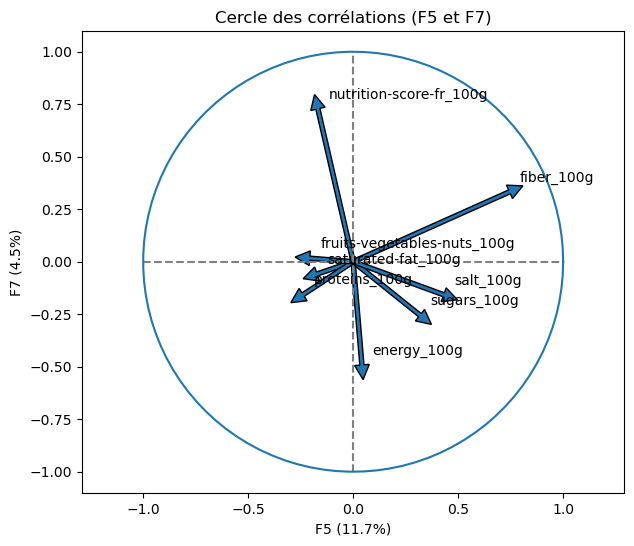

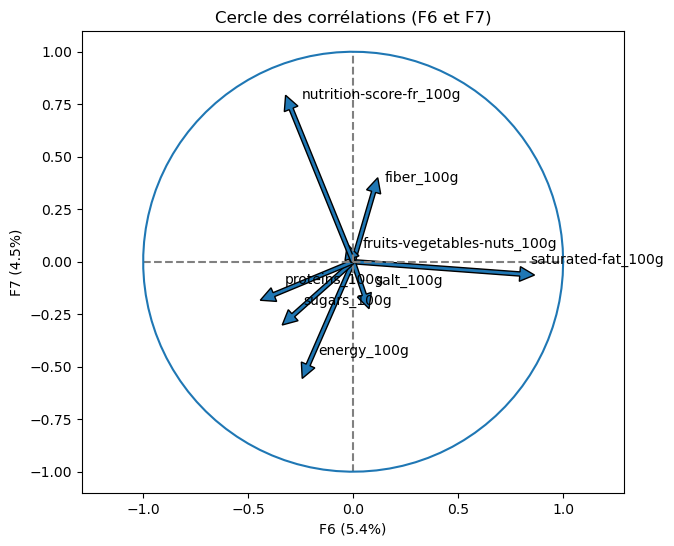

In [277]:
for i in range(7):
 for j in range(i, 7):
    if i != j:
     correlation_graph(pca, (i,j), features)

In [278]:
# Définition des conditions et des valeurs correspondantes pour le Nutriscore_Code
conditions = [
    (OpenFoodProducts_details_short_filled['nutrition-score-fr_100g'] <= -1),
    (OpenFoodProducts_details_short_filled['nutrition-score-fr_100g'] <= 2),
    (OpenFoodProducts_details_short_filled['nutrition-score-fr_100g'] <= 10),
    (OpenFoodProducts_details_short_filled['nutrition-score-fr_100g'] <= 18),
    (OpenFoodProducts_details_short_filled['nutrition-score-fr_100g'] > 18)
]
values = [1, 2, 3, 4, 5]

# Ajout de la colonne Nutriscore_Code avec les valeurs correspondantes
OpenFoodProducts_details_short_filled['Nutriscore_Code'] = np.select(conditions, values)

# Affichage du dataframe mis à jour
OpenFoodProducts_details_short_filled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 262238 entries, 1 to 320771
Data columns (total 9 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   energy_100g                  262238 non-null  float64
 1   saturated-fat_100g           262238 non-null  float64
 2   sugars_100g                  262238 non-null  float64
 3   salt_100g                    262238 non-null  float64
 4   fiber_100g                   262238 non-null  float64
 5   proteins_100g                262238 non-null  float64
 6   fruits-vegetables-nuts_100g  262238 non-null  float64
 7   nutrition-score-fr_100g      262238 non-null  float64
 8   Nutriscore_Code              262238 non-null  int64  
dtypes: float64(8), int64(1)
memory usage: 20.0 MB


In [279]:
OpenFoodProducts_details_short_filled_proj = pca.transform(OpenFoodProducts_details_short_filled_scaled)

In [280]:
def display_factorial_planes(   OpenFoodProducts_details_short_filled_projected, 
                                x_y, 
                                pca=None, 
                                labels = None,
                                clusters=None, 
                                alpha=1,
                                figsize=[10,8], 
                                marker="." ):
    """
    Affiche la projection des individus

    Positional arguments : 
    -------------------------------------
    OpenFoodProducts_details_short_filled__projected : np.array, pd.DataFrame, list of list : la matrice des points projetés
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2

    Optional arguments : 
    -------------------------------------
    pca : sklearn.decomposition.PCA : un objet PCA qui a été fit, cela nous permettra d'afficher la variance de chaque composante, default = None
    labels : list ou tuple : les labels des individus à projeter, default = None
    clusters : list ou tuple : la liste des clusters auquel appartient chaque individu, default = None
    alpha : float in [0,1] : paramètre de transparence, 0=100% transparent, 1=0% transparent, default = 1
    figsize : list ou tuple : couple width, height qui définit la taille de la figure en inches, default = [10,8] 
    marker : str : le type de marker utilisé pour représenter les individus, points croix etc etc, default = "."
    """

    # Transforme OpenFoodProducts_details_short_filled__projected en np.array
    OpenFoodProducts_details_short_filled_ = np.array(OpenFoodProducts_details_short_filled_projected)

    # On définit la forme de la figure si elle n'a pas été donnée
    if not figsize: 
        figsize = (7,6)

    # On gère les labels
    if  labels is None : 
        labels = []
    try : 
        len(labels)
    except Exception as e : 
        raise e

    # On vérifie la variable axis 
    if not len(x_y) ==2 : 
        raise AttributeError("2 axes sont demandées")   
    if max(x_y )>= OpenFoodProducts_details_short_filled_.shape[1] : 
        raise AttributeError("la variable axis n'est pas bonne")   

    # on définit x et y 
    x, y = x_y

    # Initialisation de la figure       
    fig, ax = plt.subplots(1, 1, figsize=figsize)

    # On vérifie s'il y a des clusters ou non
    c = None if clusters is None else clusters
 
    # Les points    
    # plt.scatter(   OpenFoodProducts_details_short_filled_[:, x], OpenFoodProducts_details_short_filled_[:, y], alpha=alpha, 
    #                     c=c, cmap="Set1", marker=marker)
    sns.scatterplot(data=None, x=OpenFoodProducts_details_short_filled_[:, x], y=OpenFoodProducts_details_short_filled_[:, y], hue=c, palette='RdYlGn_r')

    # Si la variable pca a été fournie, on peut calculer le % de variance de chaque axe 
    if pca : 
        v1 = str(round(100*pca.explained_variance_ratio_[x]))  + " %"
        v2 = str(round(100*pca.explained_variance_ratio_[y]))  + " %"
    else : 
        v1=v2= ''

    # Nom des axes, avec le pourcentage d'inertie expliqué
    ax.set_xlabel(f'F{x+1} {v1}')
    ax.set_ylabel(f'F{y+1} {v2}')

    # Valeur x max et y max
    x_max = np.abs(OpenFoodProducts_details_short_filled_[:, x]).max() *1.1
    y_max = np.abs(OpenFoodProducts_details_short_filled_[:, y]).max() *1.1

    # On borne x et y 
    ax.set_xlim(left=-x_max, right=x_max)
    ax.set_ylim(bottom= -y_max, top=y_max)

    # Affichage des lignes horizontales et verticales
    plt.plot([-x_max, x_max], [0, 0], color='grey', alpha=0.8)
    plt.plot([0,0], [-y_max, y_max], color='grey', alpha=0.8)

    # Affichage des labels des points
    if len(labels) : 
        # Si si je l'ai bien lu la fonction
        for i,(_x,_y) in enumerate(OpenFoodProducts_details_short_filled_[:,[x,y]]):
            plt.text(_x, _y+0.05, labels[i], fontsize='14', ha='center',va='center') 

    # Titre et display
    plt.title((f"Projection des individus (sur F{x+1} et F{y+1})"))
    plt.show()

Le vert correspond aux valeurs les plus healthy, et le rouge aux aliments qui nécessitent d'étre limité

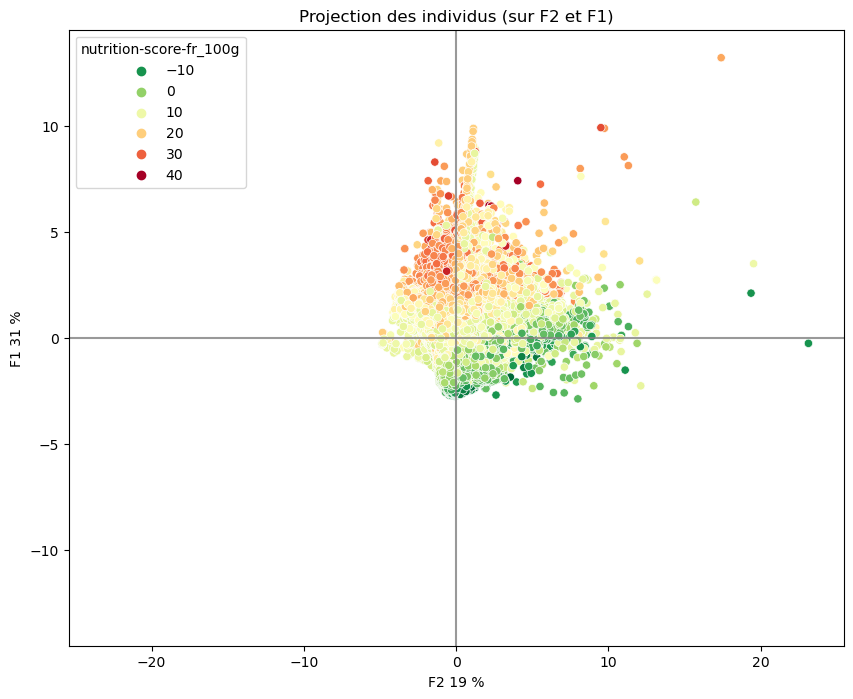

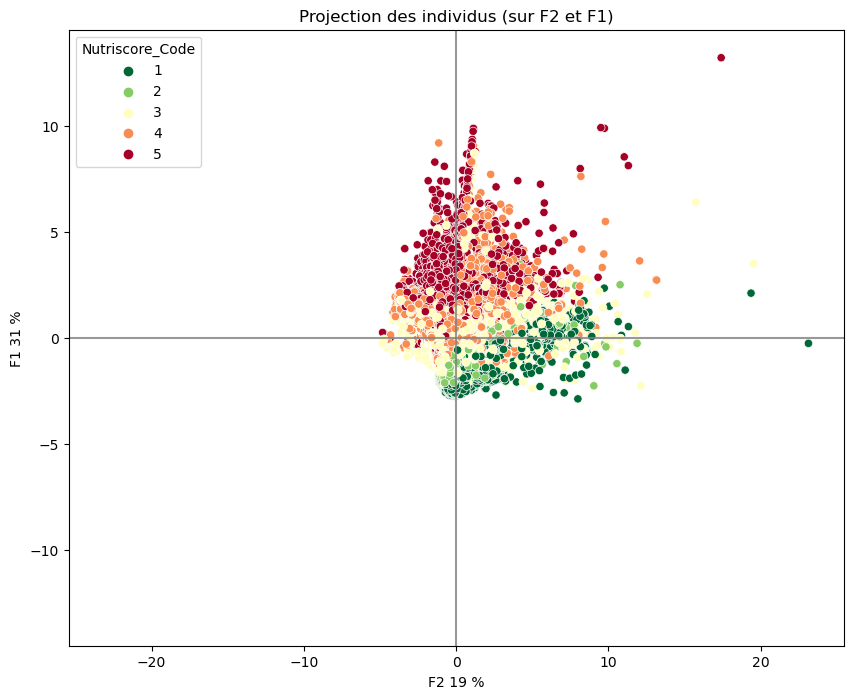

In [281]:
display_factorial_planes(OpenFoodProducts_details_short_filled_proj,(1,0),pca, clusters=OpenFoodProducts_details_short_filled['nutrition-score-fr_100g'])
display_factorial_planes(OpenFoodProducts_details_short_filled_proj,(1,0),pca, clusters=OpenFoodProducts_details_short_filled['Nutriscore_Code'])

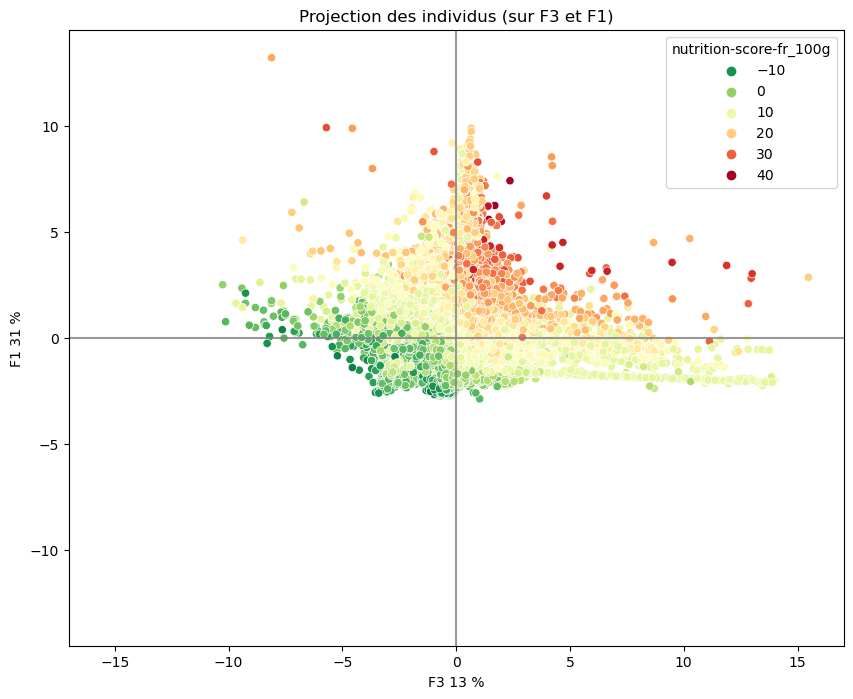

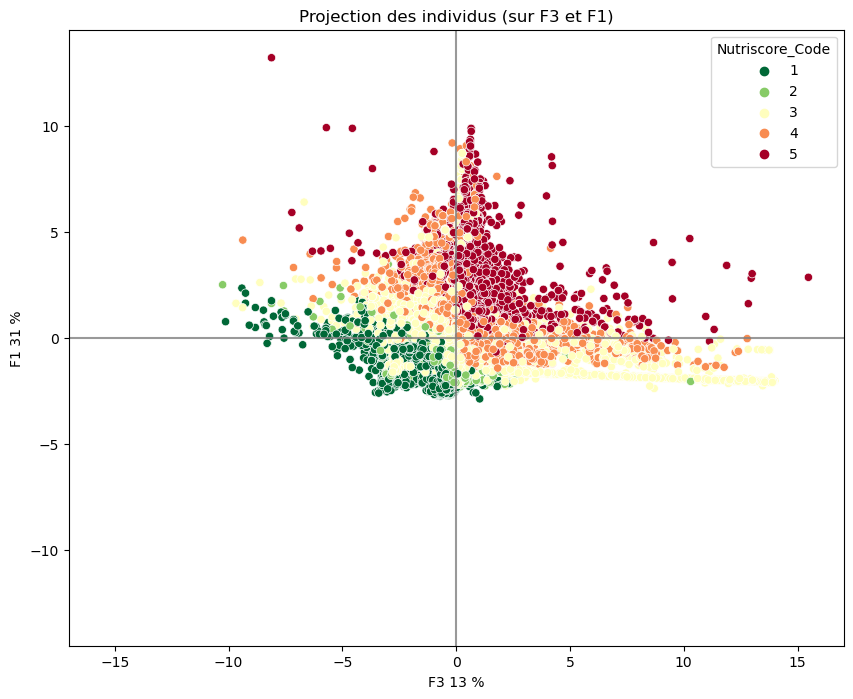

In [282]:
display_factorial_planes(OpenFoodProducts_details_short_filled_proj,(2,0), pca, clusters=OpenFoodProducts_details_short_filled['nutrition-score-fr_100g'])
display_factorial_planes(OpenFoodProducts_details_short_filled_proj,(2,0), pca, clusters=OpenFoodProducts_details_short_filled['Nutriscore_Code'])

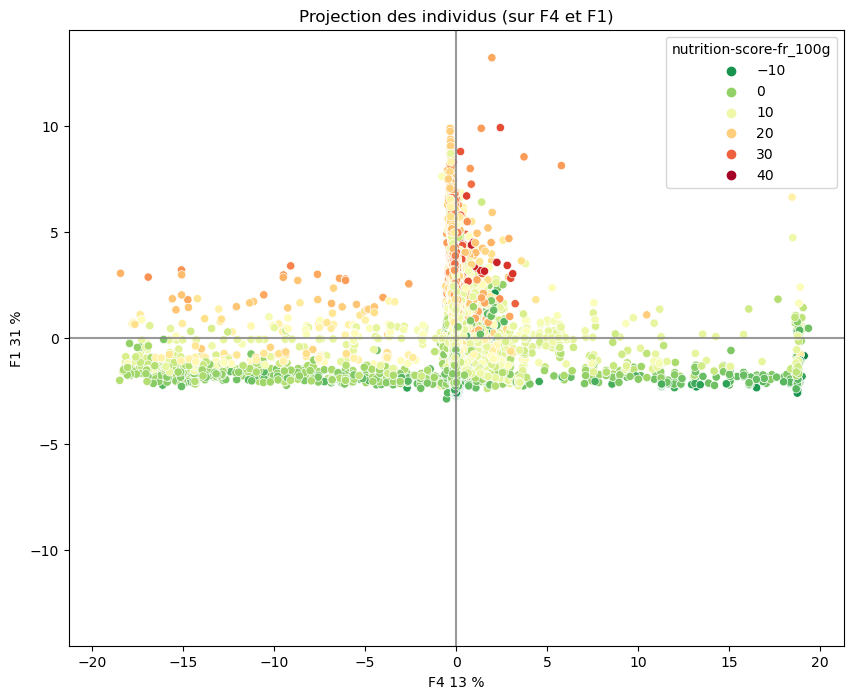

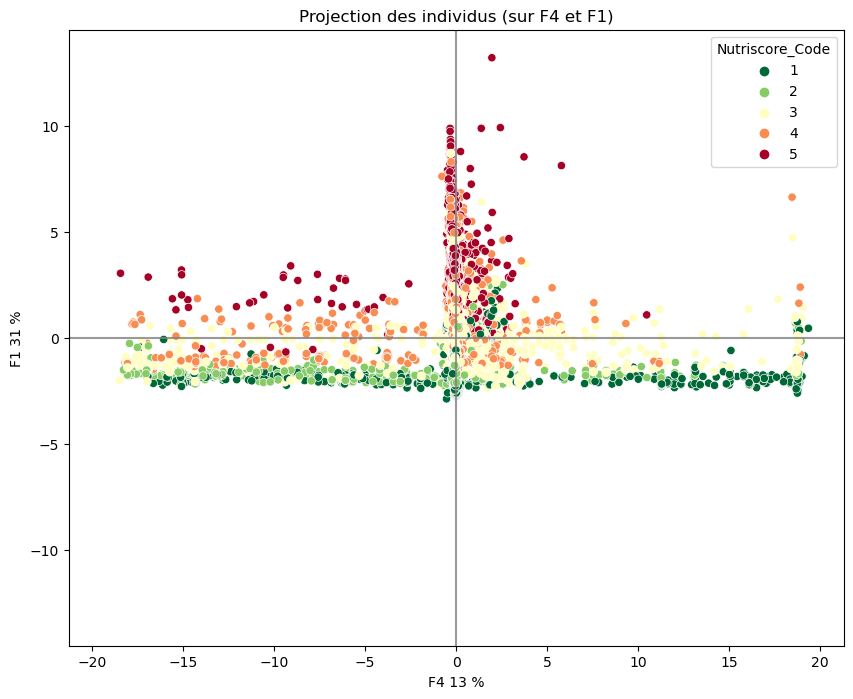

In [283]:
display_factorial_planes(OpenFoodProducts_details_short_filled_proj,(3,0), pca, clusters=OpenFoodProducts_details_short_filled['nutrition-score-fr_100g'])
display_factorial_planes(OpenFoodProducts_details_short_filled_proj,(3,0), pca, clusters=OpenFoodProducts_details_short_filled['Nutriscore_Code'],)

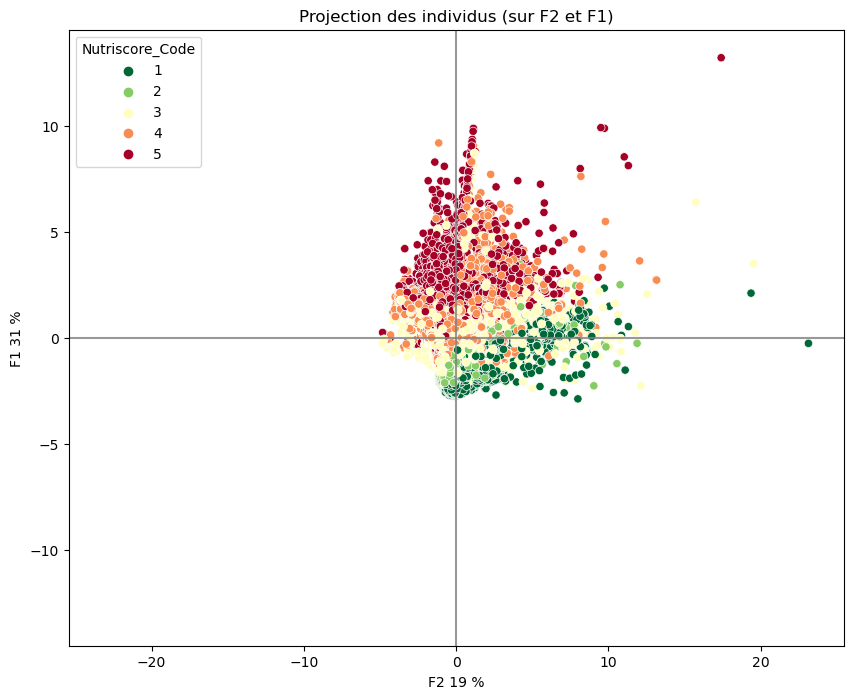

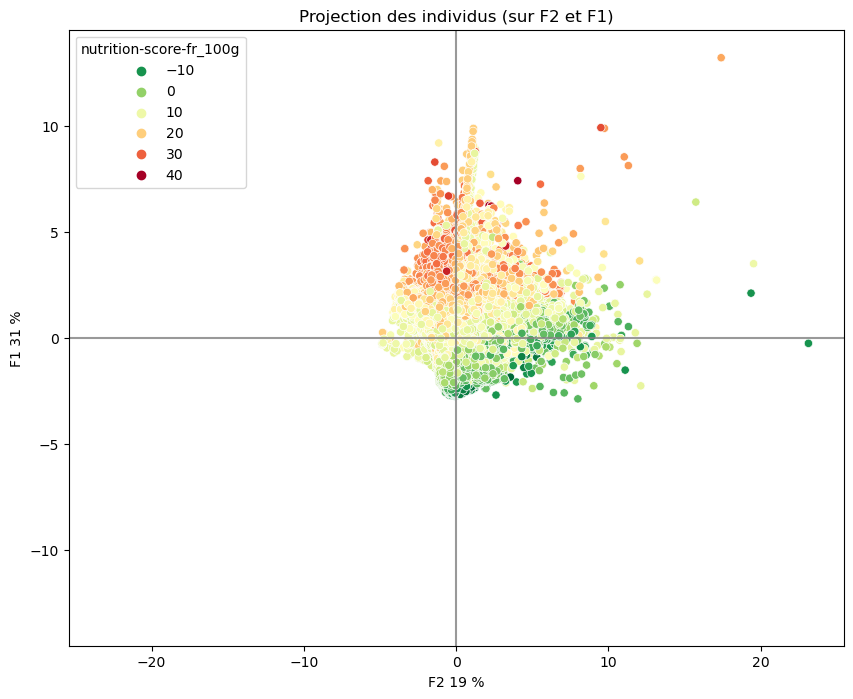

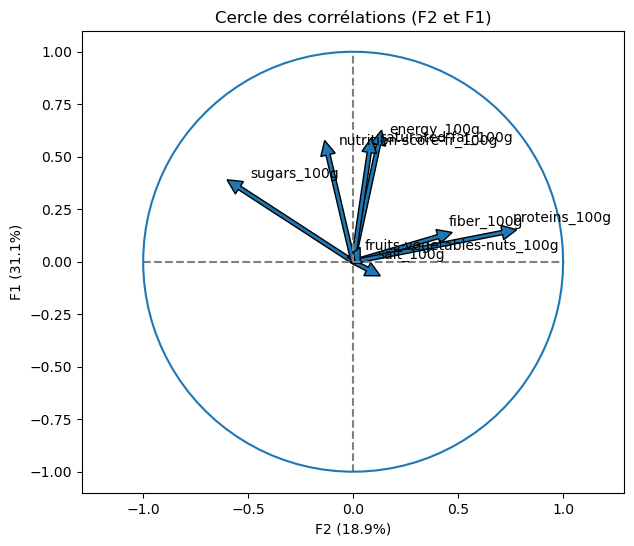

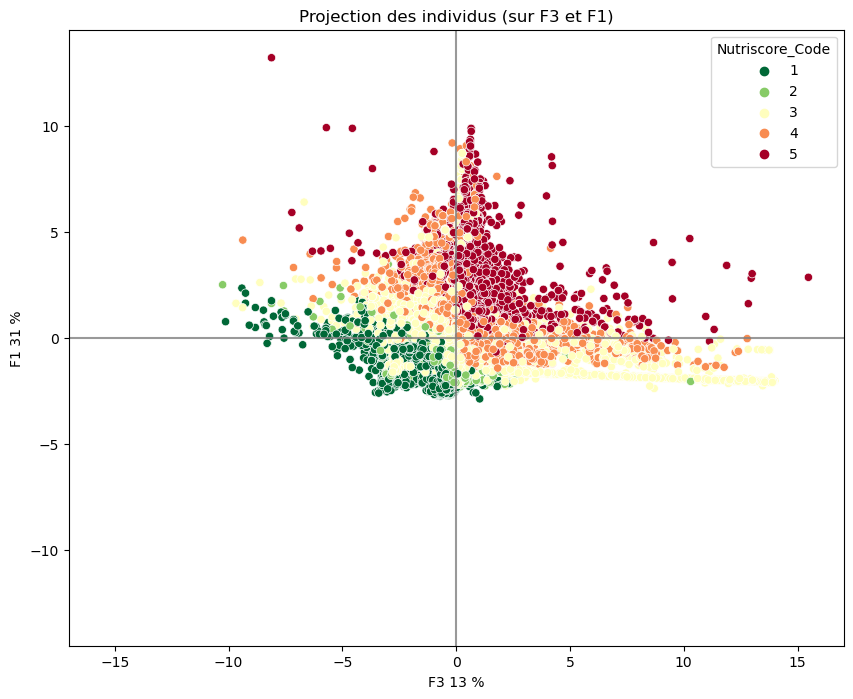

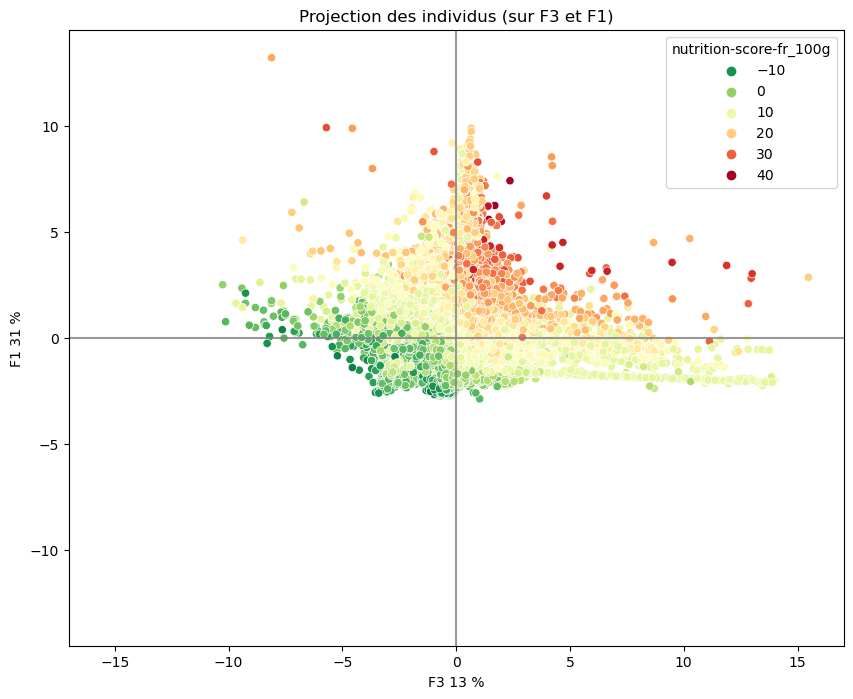

...

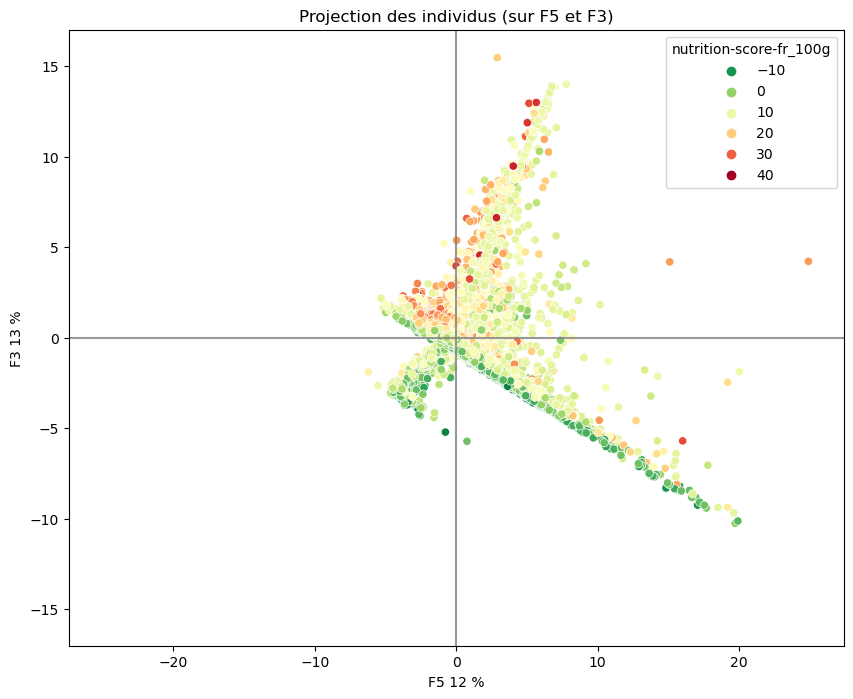

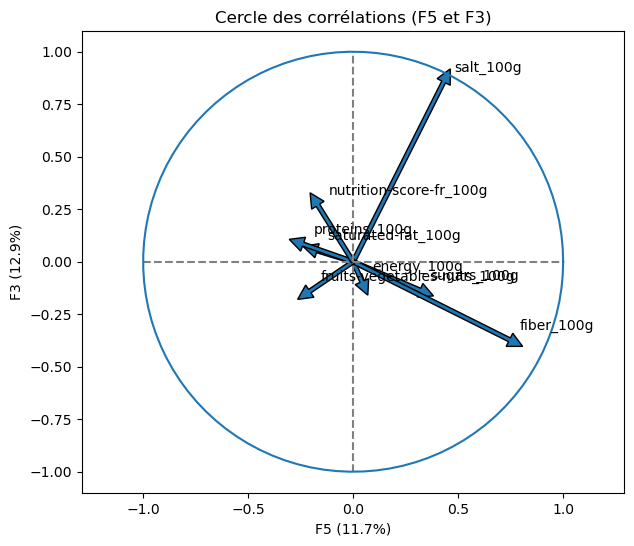

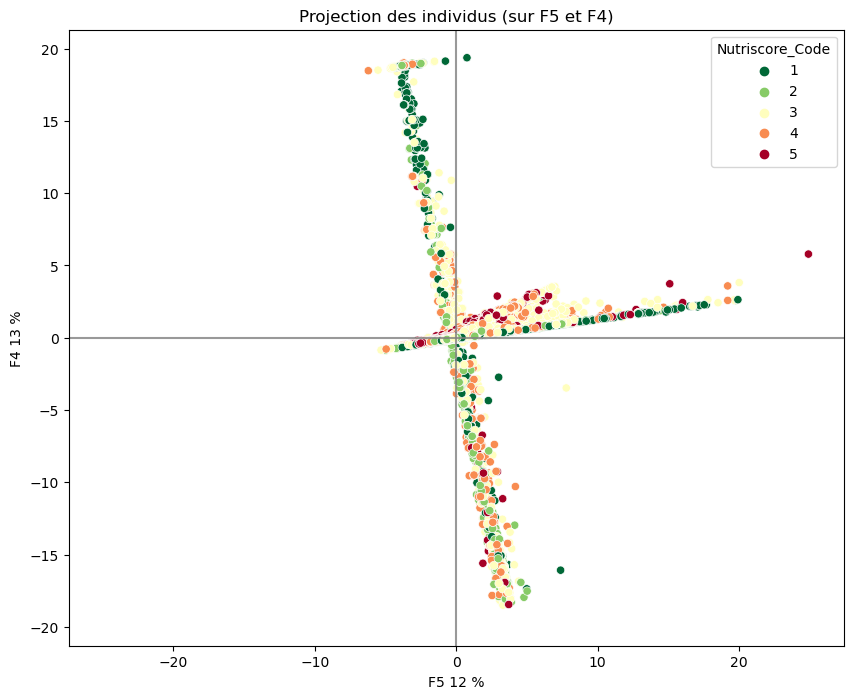

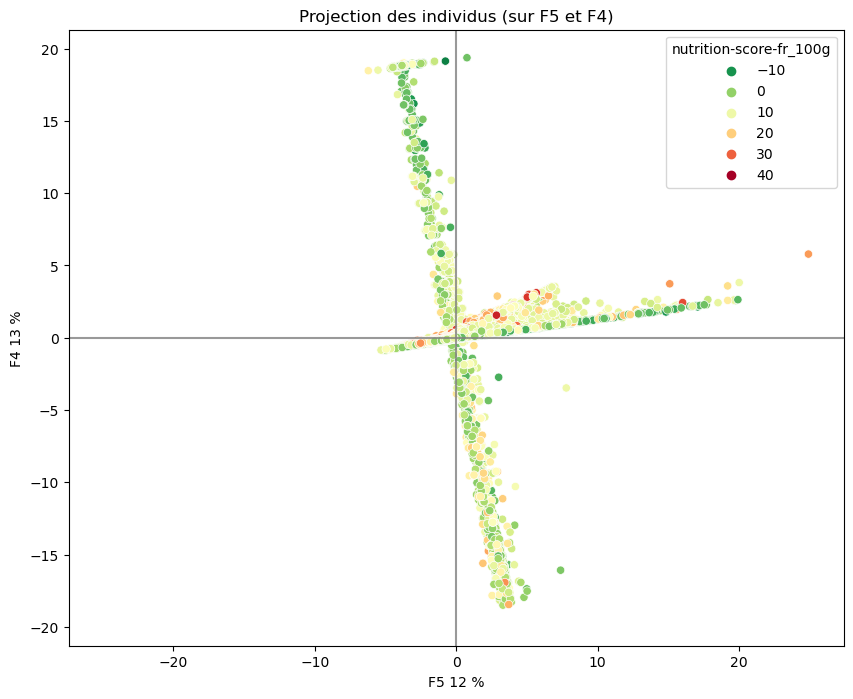

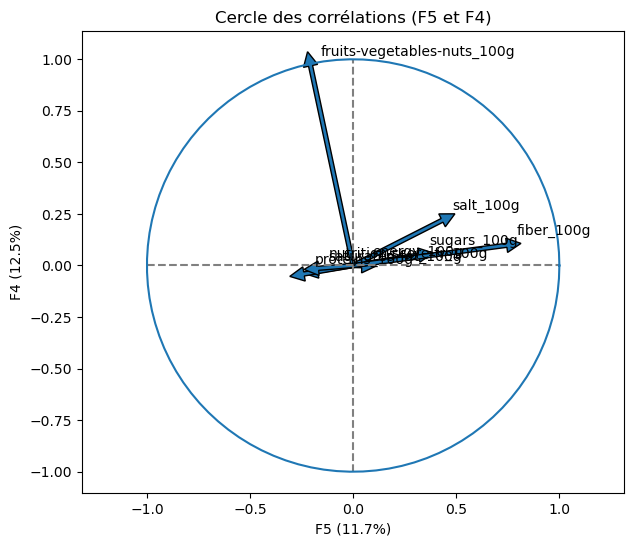

<Figure size 640x480 with 0 Axes>

In [284]:
for i in range(5):
 for j in range(5):
    if (i != j) & (i < j):
        display_factorial_planes(OpenFoodProducts_details_short_filled_proj, (j, i), pca, clusters=OpenFoodProducts_details_short_filled['Nutriscore_Code']) 
        display_factorial_planes(OpenFoodProducts_details_short_filled_proj, (j, i), pca, clusters=OpenFoodProducts_details_short_filled['nutrition-score-fr_100g'])
        correlation_graph(pca, (j,i), features)
        
plt.tight_layout()
plt.show()